### Descripción del código

Este código analiza la nubosidad observada en superficie para distintas estaciones meteorologicas

Los datos de nubosidad vienen dadas en oktas y tienen que estar guardados en *ruta_a_archivos* (un archivo por estacion)

Se hace lo siguiente: 

**Cálculo de medias mensuales**

* Calculo las medias mensuales para los meses con menos del 20% de datos faltantes
* Calculo las anomalias medias mensuales (le resto a las medias mensuales la media climatologica de cada mes calculada sobre el periodo comun con el satelite, grafico esta climatologia)
* Grafico las series temporales de las anomalias de la media mensual junto con la tendencia de theil-sen para el periodo comun con el satelite y con el periodo completo y la testeo con un test de Mann Kendall con un nivel de confianza del 95%

**Extiendo el analisis anterior a las estaciones del año**

* Promedio las anomalias de las medias mensuales calculadas previamente por cada estacion DJF, MAM, JJA, SON
* Las grafico junto con su tendencia de Theil-Sen y la testeo con un test de Mann Kendall con un nivel de confianza del 95%
* Armo tabla con tendencias anuales y estacionales de theil-sen para cada estacion 

**Cálculo de indice PC:**

Se define al parámetro de nubosidad PC (computado en %):

PC = 50 + 50 (N8 - N0) / Ntot

Donde:

* N8 = numero de observaciones con octa 8
* N0 = numero de observaciones con octa 0
* N = numero de observaciones del periodo a considerar

Tomo como periodo 1 mes y observaciones diarias, entonces:

* N8 = numero de dias con octa 8 en el mes
* N0 = numero de dias con octa 0 en el mes
* N = numero de dias del mes

**Se hace lo siguiente con PC:**
* Calculo el indice PC mensuales para los meses con menos del 20% de datos faltantes
* Calculo las anomalias de PC mensuales (le resto a las medias mensuales la PC climatologica de cada mes calculada sobre el periodo comun con el satelite, grafico esta climatologia)
* Grafico las series temporales de las anomalias de PC mensual junto con la tendencia de theil-sen para el periodo comun con el satelite y con el periodo completo y la testeo con un test de Mann Kendall con un nivel de confianza del 95%
* Calculo la correlación entre las anomalias de PC mensual junto con las medias mensuales de nubosidad

**Extiendo el analisis anterior a las estaciones del año**

* Promedio las anomalias de las PC mensuales calculadas previamente por cada estacion DJF, MAM, JJA, SON
* Las grafico junto con su tendencia de Theil-Sen y la testeo con un test de Mann Kendall con un nivel de confianza del 95%
* Armo tabla con tendencias anuales y estacionales de theil-sen para cada estacion 

**Busco indices alternativos considerando octas intermedias:**
**Cálculo de indice PC2:**

Se define al parámetro de nubosidad PC2 (computado en %):

PC = 50 + 50 (N8 + N7 + N6 - N2 - N1 - N0 ) / Ntot

Donde:

* N8 = numero de observaciones con octa 8
* N7 = numero de observaciones con octa 7
* N6 = numero de observaciones con octa 6
* N2 = numero de observaciones con octa 2
* N1 = numero de observaciones con octa 1
* N0 = numero de observaciones con octa 0
* N = numero de observaciones del periodo a considerar

Tomo como periodo 1 mes y observaciones diarias, entonces:

* N8 = numero de dias con octa 8 en el mes
* N7 = numero de dias con octa 7 en el mes
* N6 = numero de dias con octa 6 en el mes
* N2 = numero de dias con octa 2 en el mes
* N1 = numero de dias con octa 1 en el mes
* N0 = numero de dias con octa 0 en el mes
* N = numero de dias del mes

**Con PC se hace lo mismo que se hizo con PC**


----------------- 

**Paso 1** 

*Cargo librerias y funciones necesarias*

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from f_abrir_datos_smn import abrir_datos_smn
from f_graficos_smn import scatter, histograma, stackplot, barplot_oktas_separadas, barplot_oktas_juntas, lineplot_oktas_separadas, lineplot_oktas_juntas, histogramas_partidos, histogramas_partidos_poster 
#from f_procesamiento_smn import media_mensual, frecuencia_oktas_por_anio, frecuencia_oktas_por_anio_estaciones,frecuencia_oktas_por_mes, agrupo_frecuencias, agrupo_data
from f_procesamiento_smn import media_mensual, frecuencia_oktas_por_mes, agrupo_frecuencias
from f_procesamiento_nubosidad_observada_anomalias import f_tabla_tendencias_agrupo, f_tabla_tendencias_agrupo_por_estacion
from f_graficos_nubosidad_observada_anomalias import stacked_plot_barras_climatologia, barplot_oktas_separadas_climatologia, barplot_oktas_separadas_RELATIVO, barplot_oktas_separadas_RELATIVO_por_estacion

from c_clases_smn import dataframe_smn, frecuencias_oktas
import f_paletas_colores

Defino la *ruta_a_archivos* y a *ruta_a_resultados*

In [2]:
cwd = os.getcwd()
print("Current working directory: {0}".format(cwd))

trabajo_en_mi_pc = False
trabajo_en_vegeta = True

if trabajo_en_mi_pc:
    #si estoy trabajando desde mi pc parada en directorio ./Doctorado/codigos/codigos2021/nubosidad
    ruta_a_archivos = "../../../datos/smn/smn_variables_1961-2021/" #ruta donde estan los archivos con datos del smn
    ruta_a_resultados = "../../../resultados/resultados2021/nubosidad/" #ruta donde se guardan los resultados del analisis de nubosidad
     
if trabajo_en_vegeta:
    #si estoy trabajando desde el servidor vegeta
    ruta_a_archivos = "/pikachu/datos/nadia.testani/Doctorado/datos/smn/smn_variables_1961-2021/" #ruta donde estan los archivos con datos del smn
    ruta_a_archivo_estaciones_smn = "/pikachu/datos/nadia.testani/Doctorado/datos/smn/" 
    ruta_a_resultados = "/pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/" #ruta donde se guardan los resultados del analisis de nubosidad

print("--------------------")
print(f"La ruta a archivos es:{ruta_a_archivos}")
print("--------------------")
print(f"La ruta a resultados es: {ruta_a_resultados}")

Current working directory: /home/nadia.testani/Doctorado/codigos/codigos2021/nubosidad
--------------------
La ruta a archivos es:/pikachu/datos/nadia.testani/Doctorado/datos/smn/smn_variables_1961-2021/
--------------------
La ruta a resultados es: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/


----------------- 

**Paso 2** 

*Cargo los datos*

In [3]:
nombres_archivos = os.listdir(ruta_a_archivos)
data = {}
for nombre_archivo in nombres_archivos:
    id_data = abrir_datos_smn(ruta_a_archivos = ruta_a_archivos, nombre_archivo = nombre_archivo, 
                              variable = "nub")
    data[id_data[0]] = id_data[1]

ides_omm = list(data.keys()) 

*Cargo informacion de estaciones*

In [4]:
#%% Cargo informacion sobre estaciones SMN
estaciones_smn = pd.read_excel(f"{ruta_a_archivo_estaciones_smn}Exp185151.xlsx", sheet_name = "Estaciones", 
                               names = ["EST", "NOMBRE", "LAT", "LON", "ALT"]) #smn

estaciones_smn

,EST,NOMBRE,LAT,LON,ALT
0,87281,MERCEDES AERO (CTES),29.13,58.06,107
1,87393,MONTE CASEROS AERO,30.16,57.39,54
2,87270,RECONQUISTA AERO,29.11,59.42,53
3,87289,PASO DE LOS LIBRES AERO,29.41,57.09,70
4,87178,POSADAS AERO,27.22,55.58,125
5,87166,CORRIENTES AERO,27.27,58.46,62
6,87395,CONCORDIA AERO,31.18,58.01,38
7,87155,RESISTENCIA AERO,27.27,59.03,52
8,87173,ITUZAINGO,27.35,56.40,72
9,87187,OBERA,27.29,55.08,303


*Defino diccionario con numeros y nombres de estaciones ordenadas por region, extraigo ides y nombres*

In [5]:
#cambio ides_omm para que queden ordenadas por region
estaciones_ordenadas = {87148: "Roque Saenz Peña", 87166: "Corrientes", 87178: "Posadas Aero",
                        87187: "Oberá", 87270: "Reconquista Aero", 87289: "Paso de los Libres Aero",
                        87393: "Montecaseros", 87395: "Concordia Aero"}

ides_omm_ordenado = list(estaciones_ordenadas.keys())
nombres_ides_omm_ordenado = list(estaciones_ordenadas.values())

*Defino la fecha de inicio en el que quiero analizar las series temporales de nubosidad*

In [6]:
periodo_satelite = True
periodo_completo = False

if periodo_satelite: #periodo comun con satelite (Diciembre 1983 a Noviembre 2016)
    fecha_inicio_str = "1983-12-15"
    fecha_final_str = "2016-11-15"

if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
    fecha_inicio_str = "1961-01-01" 
    fecha_final_str = "2020-12-31" 

#climatologia: periodo comun con satelite (Diciembre 1983 a Noviembre 2016)
fecha_inicio_climatologia_str = "1983-12-15"
fecha_final_climatologia_str = "2016-11-15"


*Defino el porcentaje de na admitido para estimar la frecuencia relativa mensual*

In [7]:
porcentaje_na_admitido = 20

*Genero (o me paro si es que ya existe) en el directorio de resultados especifico para guardar lo que se genere*

In [8]:
print("-----------------")
print("Manejo de directorios")
print("-----------------")
print(f"Se para en el directorio de resultados generales llamado: {ruta_a_resultados}")
os.chdir(ruta_a_resultados) #se para en ruta general de resultados de nubosidad
print("-----------------")

if "nubosidad_observada" not in os.listdir():
    print(f"Genera directorio llamado: nubosidad_observada en {ruta_a_resultados}")
    os.mkdir("nubosidad_observada")
print(f"Se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada")
os.chdir("./nubosidad_observada") #se para en nubosidad_observada
print("-----------------")

if "smn" not in os.listdir():
    print(f"genera directorio llamado: smn en {ruta_a_resultados}nubosidad_observada")
    os.mkdir("smn")
print(f"Se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada/smn")
os.chdir("./smn") #se para en smn
print("-----------------")

if "data_mensual" not in os.listdir():
    print(f"Genera directorio llamado: data_mensual en {ruta_a_resultados}nubosidad_observada/smn")
    os.mkdir("data_mensual")
print(f"Se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada/smn/data_mensual")
os.chdir("./data_mensual") #se para en data_mensual
print("-----------------")

if f"admite_{porcentaje_na_admitido}porc_na" not in os.listdir():
    print(f"genera directorio llamado: admite_{porcentaje_na_admitido}porc_na en {ruta_a_resultados}nubosidad_observada/smn/data_mensual")
    os.mkdir(f"admite_{porcentaje_na_admitido}porc_na")
print(f"Se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na")
directorio_na = f"admite_{porcentaje_na_admitido}porc_na"
os.chdir("./"+directorio_na) #se para en admite_{porcentaje_na_admitido}porc_na
print("-----------------")

if "series_diario" not in os.listdir():
    print(f"Genera directorio llamado: series_diario en {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na")
    os.mkdir("series_diario")
print(f"Se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na/series_diario")
os.chdir("./series_diario") #se para en series_diario, aca se van a guardar los resultados 
print("-----------------")

-----------------
Manejo de directorios
-----------------
Se para en el directorio de resultados generales llamado: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/
-----------------
Se para en el directorio llamado: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada
-----------------
Se para en el directorio llamado: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn
-----------------
Se para en el directorio llamado: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual
-----------------
Se para en el directorio llamado: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual/admite_20porc_na
-----------------
Se para en el directorio llamado: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual/a

----------------- 

**Paso 3** 

*Se mueve un directorio para atras, genero o me paro en carpeta datos, y genero y guardo (o abro, si ya existe) un csv con datos de la media mensual de nubosidad*

*Para calcular la media mensual usamos la funcion media_mensual de f_procesamiento_smn*

*La media mensual se calcula sobre los meses que tienen menos del 20% de dias del mes con datos faltantes*

*Los archivos con las medias los acomodo en diccionario*

In [9]:
os.chdir("../") #se mueve uno atras: a admite_porc_na
print("-----------------") 
if "datos" not in os.listdir():
    print(f"genera directorio llamado: datos en {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na")
    os.mkdir("datos")
print(f"se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na/datos")
os.chdir("./datos") #se para en datos, aca se van a guardar los resultados 
print("-----------------")    

data_medias_mensuales = {} #genero diccionario donde se van a guardar las frecuencias mensuales

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    ##abro o genero archivo con frecuencias
    #if f"media_mensual_{id_omm}.csv" not in os.listdir():
    print(f"genera un archivo: media_mensual_{id_omm}.csv en {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na/datos")
    media_mensual_df = media_mensual(id_omm, data[id_omm], ".", 20)
    #else:
     #   media_mensual = pd.read_csv(f"media_mensual_{id_omm}.csv", index_col="fecha")

    #lo acomodo en diccionarios
    data_medias_mensuales[id_omm] = media_mensual_df

print("Se generaron diccionarios con data frames de medias mensuales para cada estacion")
print("Cada elemento de esos diccionarios (un elemento por estacion) tiene esta pinta:")
print("-----------------") 
print("Medias mensuales:")
print(data_medias_mensuales[87166].iloc[0:3])
print("-----------------") 


-----------------
se para en el directorio llamado: /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual/admite_20porc_na/datos
-----------------
genera un archivo: media_mensual_87148.csv en /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual/admite_20porc_na/datos
genera un archivo: media_mensual_87166.csv en /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual/admite_20porc_na/datos
genera un archivo: media_mensual_87178.csv en /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual/admite_20porc_na/datos
genera un archivo: media_mensual_87187.csv en /pikachu/datos/nadia.testani/Doctorado/resultados/resultados2021/nubosidad/nubosidad_observada/smn/data_mensual/admite_20porc_na/datos
genera un archivo: media_mensual_87270.csv en /pikachu/datos/nadia.test

In [10]:
climatologia_medias_mensuales = {} 

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    #calculo climatologia
    media_mensual_df = data_medias_mensuales[id_omm]
    media_mensual_df.index = pd.to_datetime(media_mensual_df.index)
    media_mensual_fechas_climatologia = media_mensual_df.loc[fecha_inicio_climatologia_str:fecha_final_climatologia_str]
    media_mensual_climatologia = media_mensual_fechas_climatologia.groupby(media_mensual_fechas_climatologia.index.month).mean() 
    media_mensual_climatologia
    #Lo guardo en diccionario: climatologia_medias_mensuales
    climatologia_medias_mensuales[id_omm] = media_mensual_climatologia
    

*Calculo climatologia*

In [11]:
def plot_barras_climatologia(medias, estaciones, id_estacion,
                             anio_inicio = 1983, anio_final = 2016,
                             idioma = "ingles"):
    
    nombre_estacion = estaciones[id_estacion]
    
    width = 0.98      #ancho de las barras
    if idioma == "ingles":
        meses = ['J', 'F', 'M', 'A', 'M', "J", "J", "A", "S", "O","N", "D"] #inicial meses
    elif idioma == "español":
        meses = ['E', 'F', 'M', 'A', 'M', "J", "J", "A", "S", "O","N", "D"] #inicial meses
    
    
    plt.figure(num=1, figsize=(8, 5), dpi=600) #genero figura
    ax = plt.gca()
    ax.set_facecolor('#E7E7DE') #seteo color de fondo
    ax.bar(medias.index, medias[0], width,color = "k")
    
    
    if idioma == "ingles":
        ax.set_ylabel('Cloud cover (oktas)')
    elif idioma == "español":
        ax.set_ylabel('Cobertura nubosa (octas)')
    
    plt.ylim(0, 8)
    plt.xlim(medias.index[0]-0.5, medias.index[-1]+0.5)
    ax.set_xticks(medias.index)
    ax.set_xticklabels(meses)
    
    if idioma == "ingles":
        plt.xlabel("Month")
        plt.title(f"Climatology of daily total cloud cover ({anio_inicio}-{anio_final}) SMN \n {nombre_estacion} ({id_estacion})")
    elif idioma == "español":
        plt.xlabel("Mes")
        plt.title(f"Climatología de cobertura nubosa media diaria ({anio_inicio}-{anio_final}) SMN \n {nombre_estacion} ({id_estacion})")
    
    plt.savefig(f"climatologia_media_nubosidad_{id_estacion}_{idioma}.png")
    plt.show()

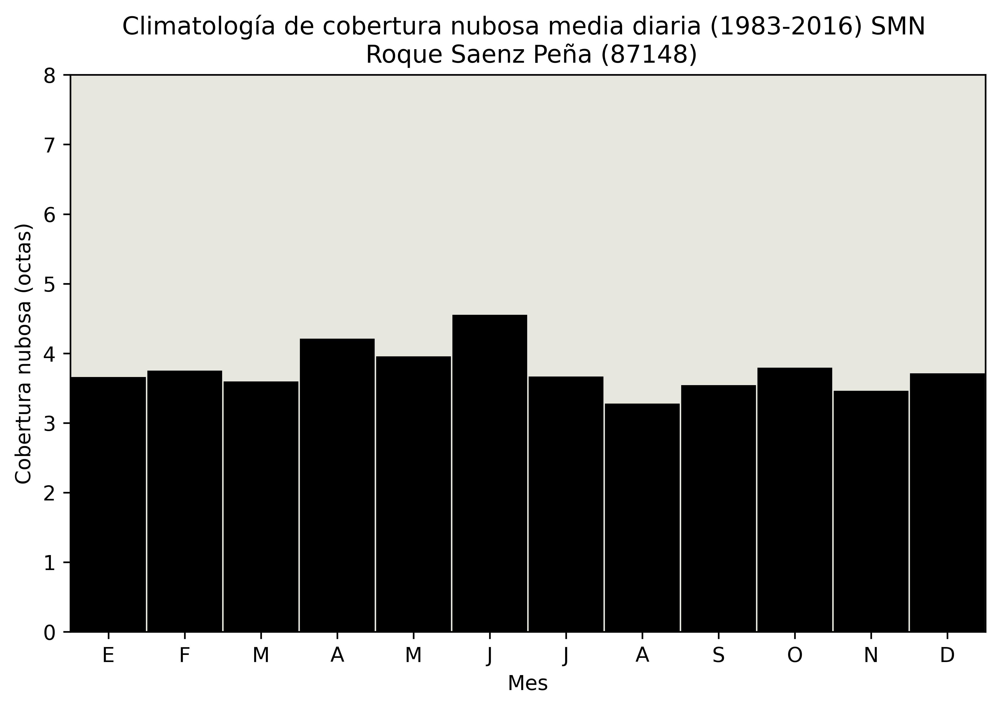

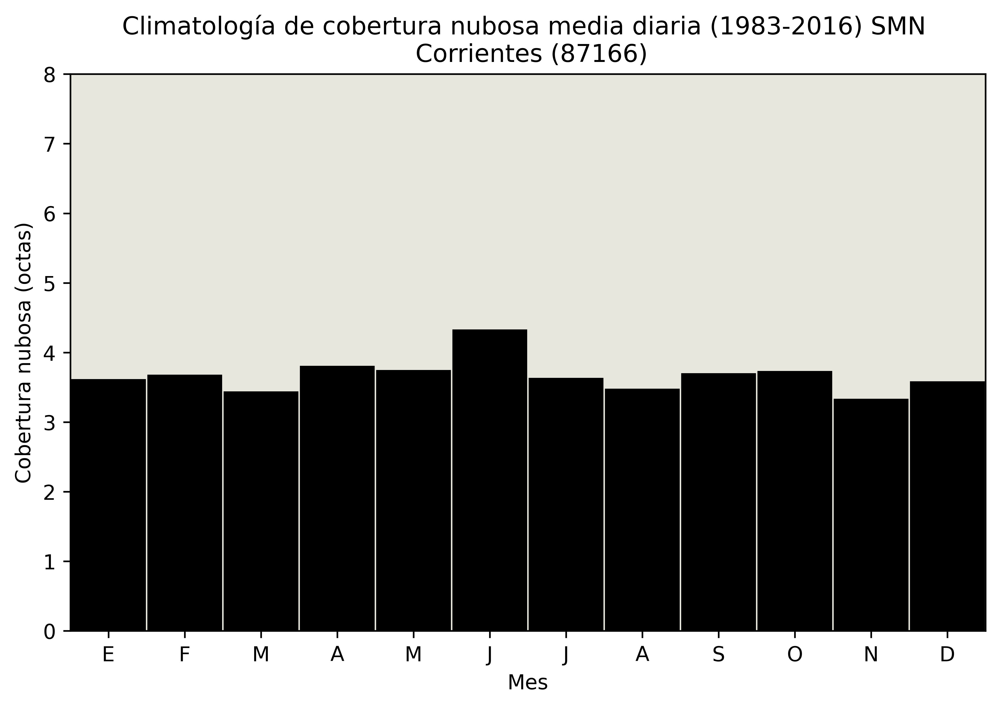

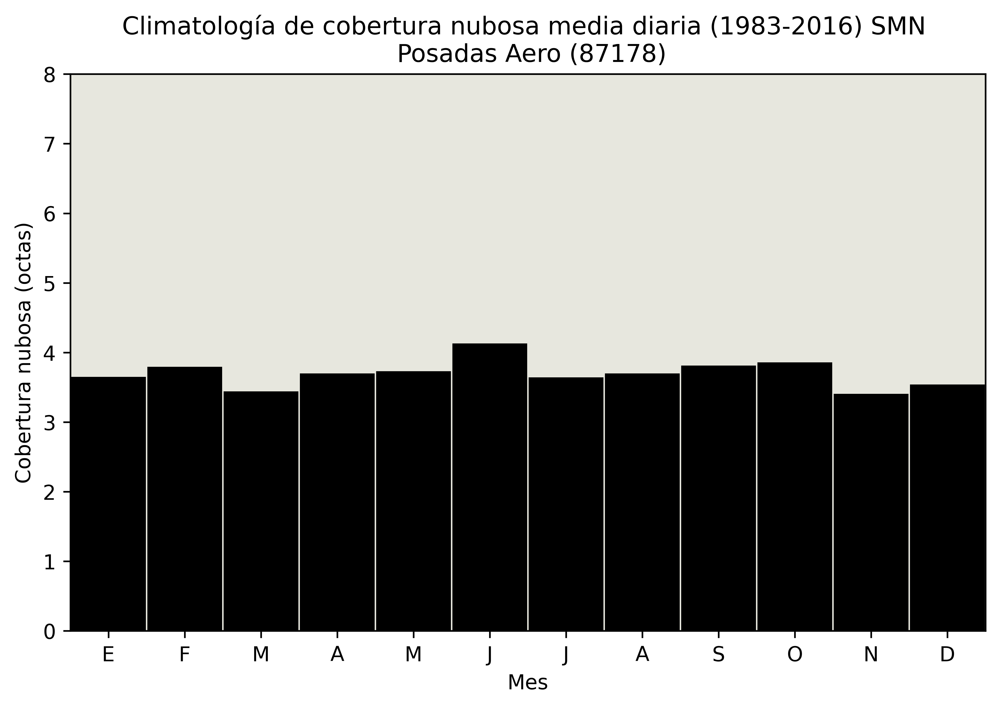

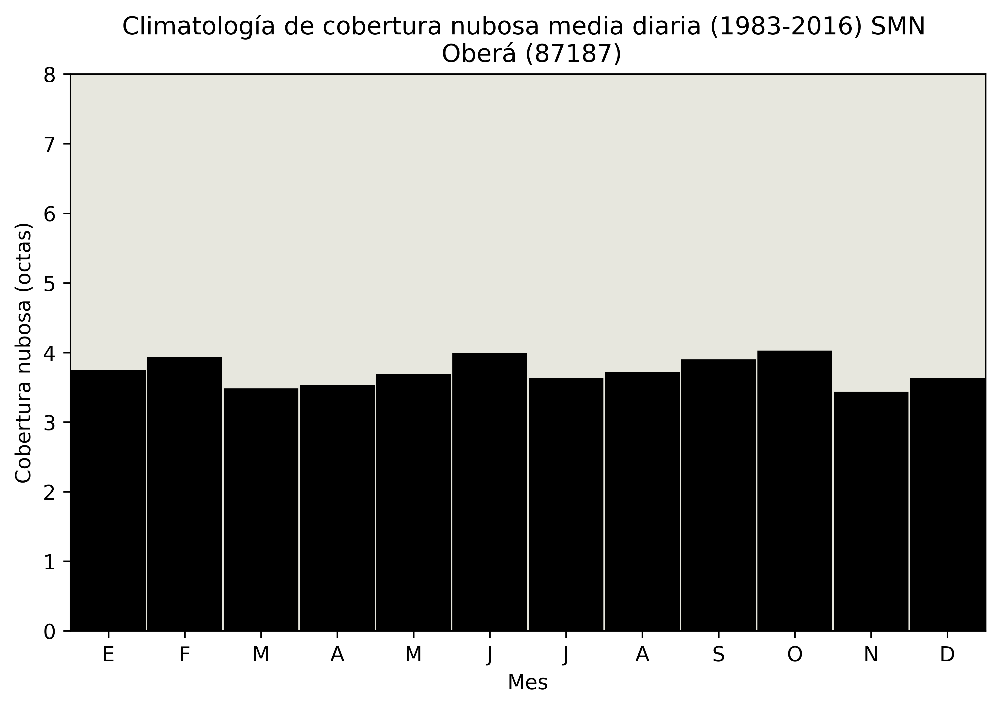

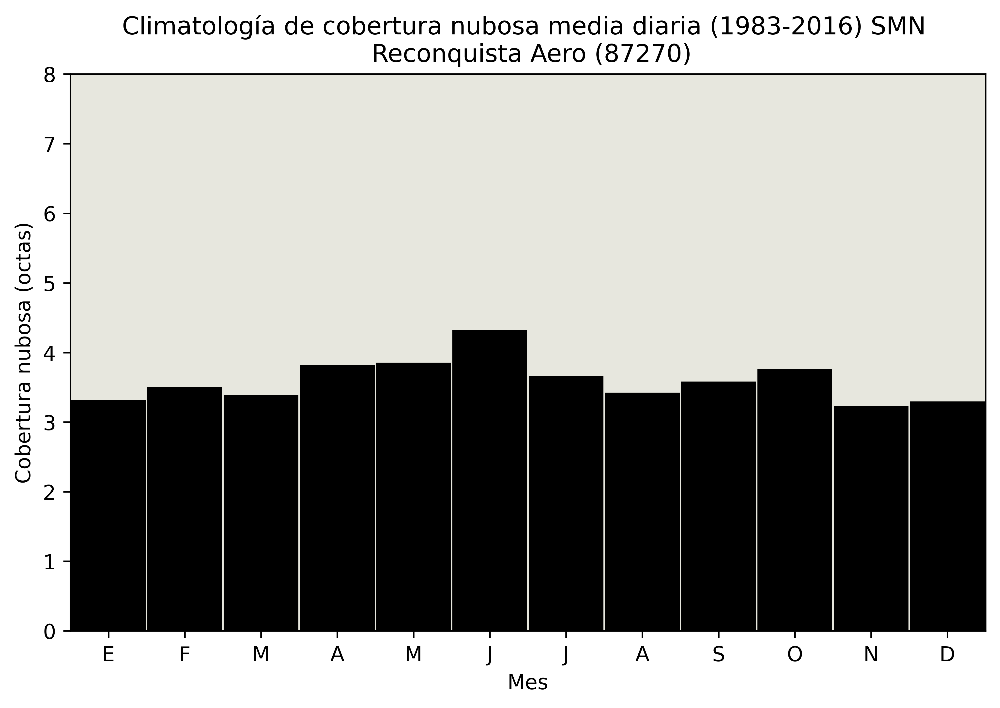

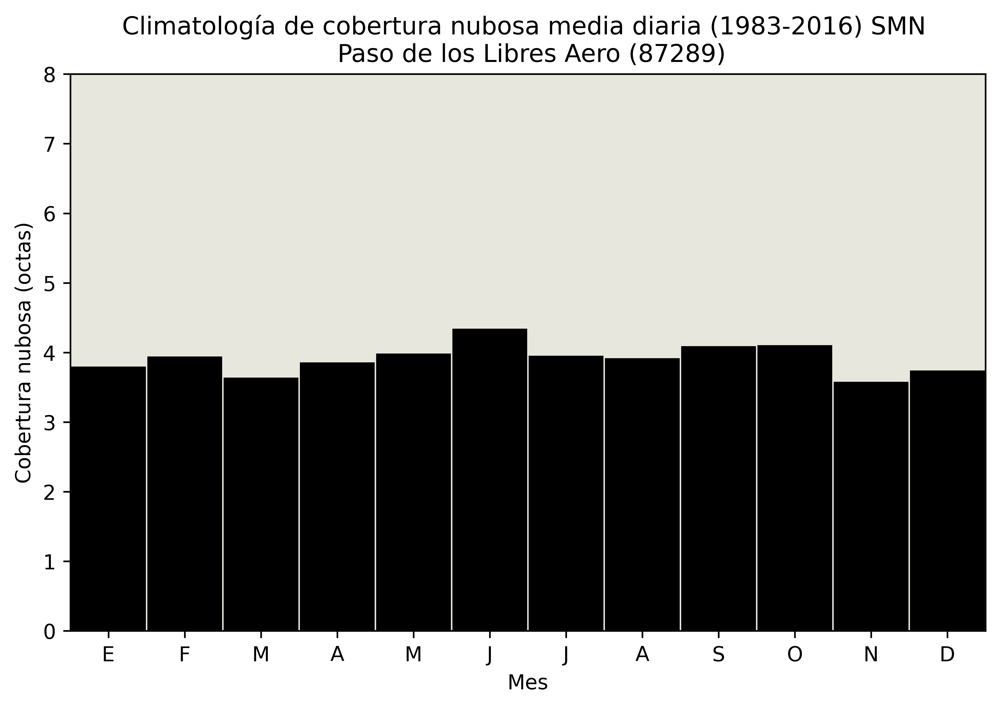

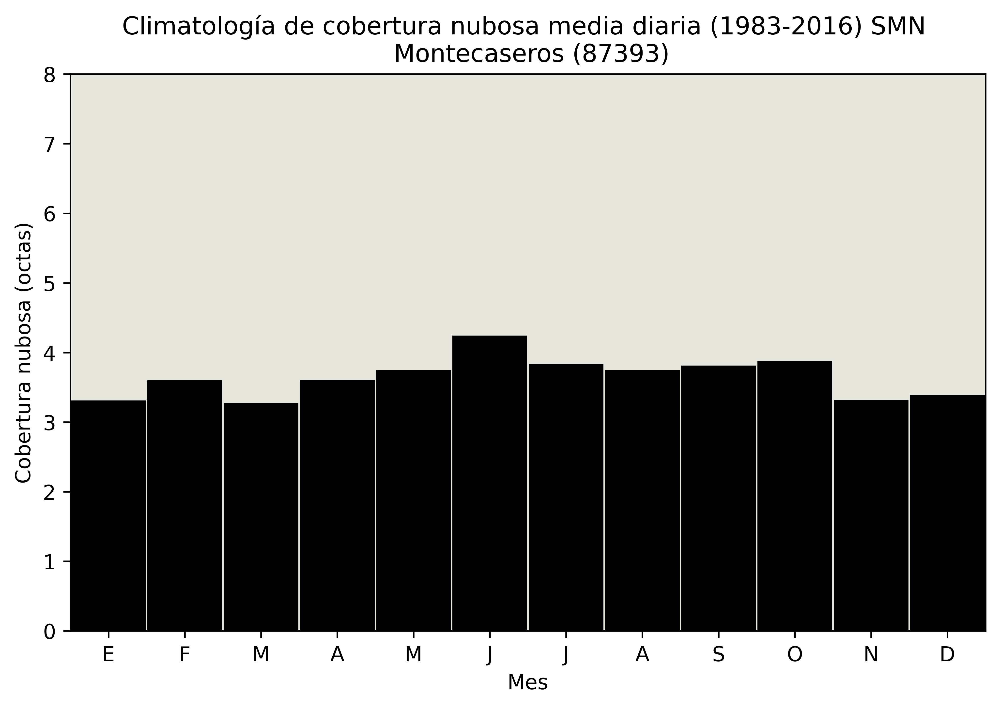

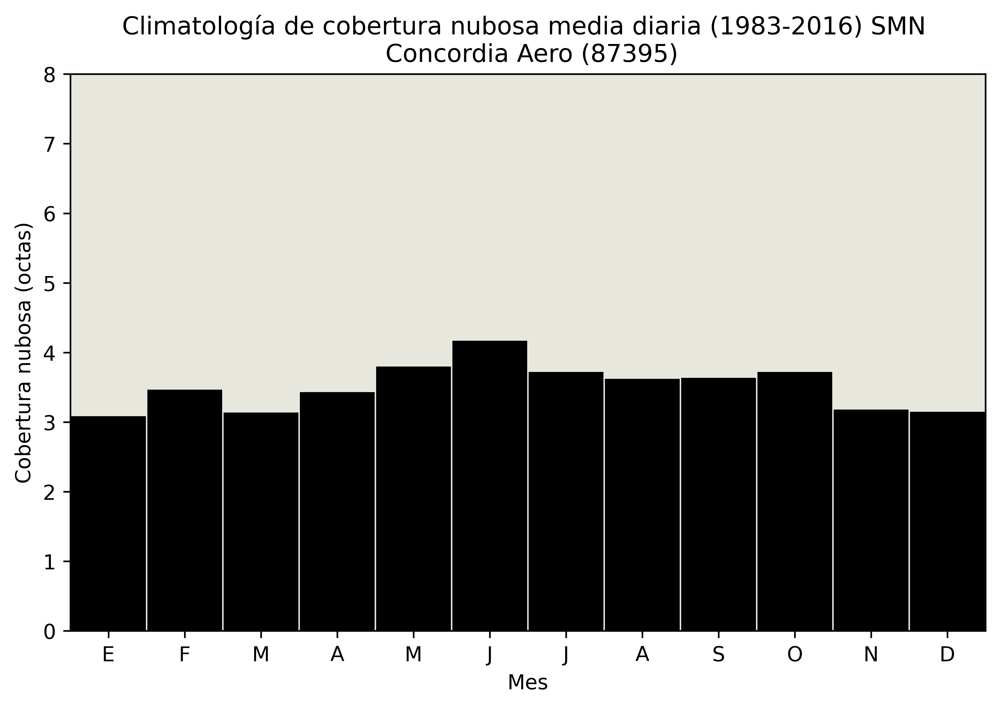

In [12]:
for id_omm in ides_omm_ordenado:
    plot_barras_climatologia(climatologia_medias_mensuales[id_omm], estaciones_ordenadas, id_estacion = id_omm,
                                 anio_inicio = 1983, anio_final = 2016,
                                 idioma = "español")

**Hago este grafico pero medio regional -paper NEA-**

In [13]:
climatologia_medias_mensuales_media_regional = (climatologia_medias_mensuales[ides_omm_ordenado[0]]+climatologia_medias_mensuales[ides_omm_ordenado[1]]+climatologia_medias_mensuales[ides_omm_ordenado[2]]+climatologia_medias_mensuales[ides_omm_ordenado[3]]+climatologia_medias_mensuales[ides_omm_ordenado[4]]+climatologia_medias_mensuales[ides_omm_ordenado[5]]+climatologia_medias_mensuales[ides_omm_ordenado[6]]+climatologia_medias_mensuales[ides_omm_ordenado[7]])/8

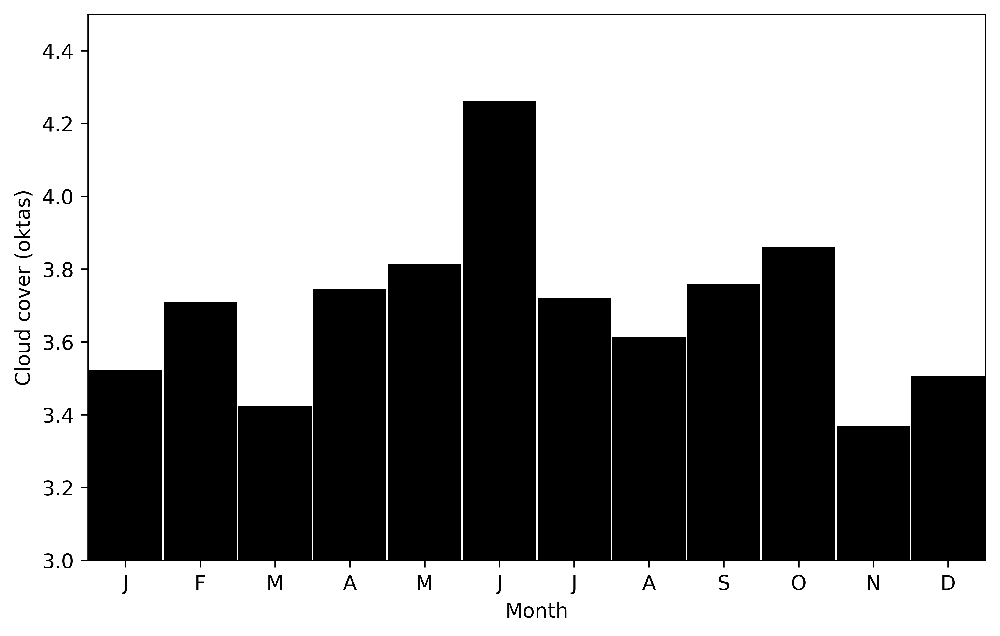

In [14]:
width = 0.98      #ancho de las barras
meses = ['J', 'F', 'M', 'A', 'M', "J", "J", "A", "S", "O","N", "D"] #inicial meses
plt.figure(num=1, figsize=(8, 5), dpi=600) #genero figura
ax = plt.gca()
ax.bar([1,2,3,4,5,6,7,8,9,10,11,12], climatologia_medias_mensuales_media_regional[0], width,color = "k")
ax.set_ylabel('Cloud cover (oktas)')
plt.ylim(3, 4.5)
plt.xlim(0.5, 12.5)
ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
ax.set_xticklabels(meses)
plt.xlabel("Month")
plt.show()

**Hago mapa con climatologia de la media anual de cada estacion y luego lo hago por estacion**

In [15]:
climatologia_anual_medias_mensuales = {} 

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    #calculo climatologia
    media_mensual_df = data_medias_mensuales[id_omm]
    media_mensual_df.index = pd.to_datetime(media_mensual_df.index)
    media_mensual_fechas_climatologia = media_mensual_df.loc[fecha_inicio_climatologia_str:fecha_final_climatologia_str]
    media_mensual_climatologia_anual = media_mensual_fechas_climatologia.mean() 
    media_mensual_climatologia_anual
    #Lo guardo en diccionario: climatologia_medias_mensuales
    climatologia_anual_medias_mensuales[id_omm] = media_mensual_climatologia_anual
    

In [16]:
climatologia_anual_medias_mensuales

{87148: 0    3.766637
 dtype: float64,
 87166: 0    3.676275
 dtype: float64,
 87178: 0    3.701413
 dtype: float64,
 87187: 0    3.729917
 dtype: float64,
 87270: 0    3.599072
 dtype: float64,
 87289: 0    3.913431
 dtype: float64,
 87393: 0    3.647639
 dtype: float64,
 87395: 0    3.510428
 dtype: float64}

In [17]:
climatologia_estacional_medias_mensuales = {} 

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    #calculo climatologia
    media_mensual_df = data_medias_mensuales[id_omm]
    media_mensual_df.index = pd.to_datetime(media_mensual_df.index)
    media_mensual_fechas_climatologia = media_mensual_df.loc[fecha_inicio_climatologia_str:fecha_final_climatologia_str]
    
    #agrupo por estacion
    month_num_to_season =   { 1:'DJF',  2:'DJF', 
                              3:'MAM',  4:'MAM',  5:'MAM', 
                              6:'JJA',  7:'JJA',  8:'JJA',
                              9:'SON', 10:'SON', 11:'SON',
                             12:'DJF'}
    grouped =  media_mensual_fechas_climatologia.groupby(lambda x: month_num_to_season.get(x.month)) #Las expresiones lambda en Python son una forma corta de declarar funciones pequeñas y anónimas (no es necesario proporcionar un nombre para las funciones lambda). Las funciones Lambda se comportan como funciones normales declaradas con la palabra clave def                      

    media_mensual_climatologia_estacional = grouped.mean() 
    media_mensual_climatologia_estacional 
    #Lo guardo en diccionario: climatologia_estacional_medias_mensuales
    climatologia_estacional_medias_mensuales[id_omm] = media_mensual_climatologia_estacional 

In [18]:
climatologia_estacional_medias_mensuales[id_omm]

,0
fecha,
DJF,3.233936
JJA,3.837254
MAM,3.455262
SON,3.515309


In [19]:
#%% Cargo lista puntos smn
lista_puntos_smn = [(360 - lon, -1 * lat) for lon, lat in zip(estaciones_smn["LON"],estaciones_smn["LAT"])]
dict_puntos_smn = dict(zip(list(estaciones_smn["EST"]), lista_puntos_smn))
print(dict_puntos_smn)

#me quedo solo con los puntos de estaciones que efectivamente uso
lista_puntos_smn_ordenados = [dict_puntos_smn[list(estaciones_ordenadas.keys())[0]],
                              dict_puntos_smn[list(estaciones_ordenadas.keys())[1]],
                              dict_puntos_smn[list(estaciones_ordenadas.keys())[2]],
                              dict_puntos_smn[list(estaciones_ordenadas.keys())[3]],
                              dict_puntos_smn[list(estaciones_ordenadas.keys())[4]],
                              dict_puntos_smn[list(estaciones_ordenadas.keys())[5]],
                              dict_puntos_smn[list(estaciones_ordenadas.keys())[6]],
                              dict_puntos_smn[list(estaciones_ordenadas.keys())[7]]]
dict_puntos_smn_ordenados = zip(estaciones_ordenadas,lista_puntos_smn_ordenados)

{87281: (301.94, -29.13), 87393: (302.61, -30.16), 87270: (300.58, -29.11), 87289: (302.90999999999997, -29.41), 87178: (304.42, -27.22), 87166: (301.54, -27.27), 87395: (301.99, -31.18), 87155: (300.97, -27.27), 87173: (303.6, -27.35), 87187: (304.92, -27.29), 87148: (299.76, -26.45)}


/tmp/ipykernel_39248/3224437203.py:41: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(np.arange(xticks_min, xticks_max))
/tmp/ipykernel_39248/3224437203.py:44: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(np.arange(yticks_min, yticks_max))


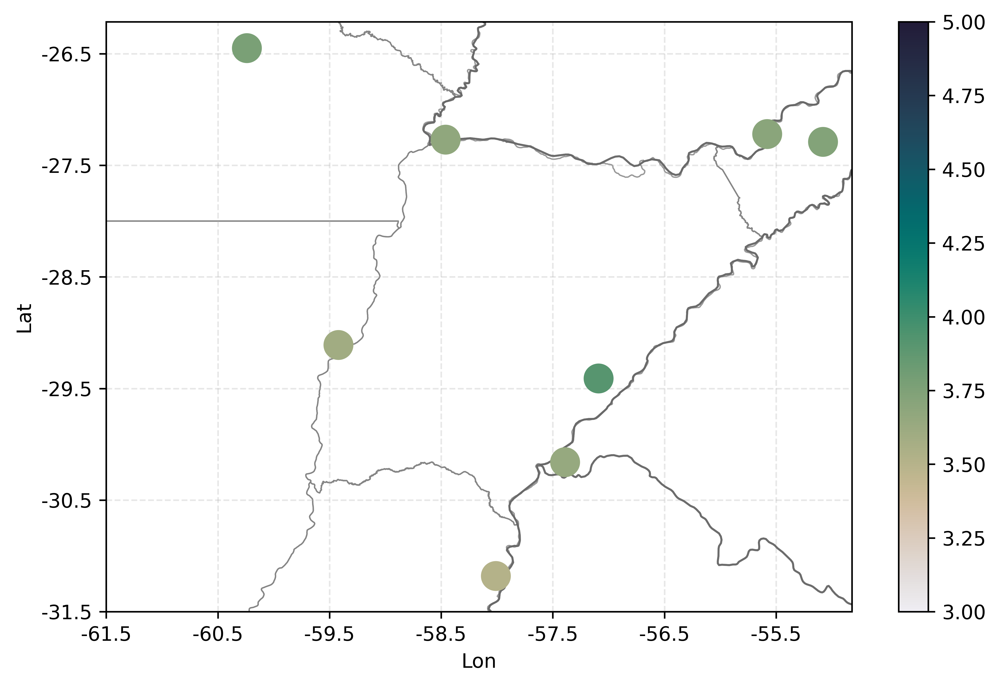

In [20]:
from f_mis_shapes import df_paises, df_provincias
import geopandas as gpd
from shapely.geometry import Point
import cartopy.crs as ccrs
import cmocean 

valor_minimo = 3
valor_maximo = 5
lat_min = -31.5
lat_max = -25.5
lon_min = -61.5
lon_max = -54.5
xticks_min = -61.5
xticks_max = -54.5
yticks_min = -31.5
yticks_max = -25.5
espacio_entre_lat_lon = 1
medias_anuales_estaciones_ordenadas = [climatologia_anual_medias_mensuales[id].values[0] for id in ides_omm_ordenado]

#defino puntos a marcar
geometry_3 = [Point(xy) for xy in lista_puntos_smn_ordenados] #lista con puntos 2
geodata3 = gpd.GeoDataFrame(lista_puntos_smn_ordenados, geometry = geometry_3)
geodata3["valores"] = medias_anuales_estaciones_ordenadas

fig1 = plt.figure(figsize = [8.5, 5.5], dpi = 600)    
ax = fig1.add_subplot(111, projection = ccrs.PlateCarree(central_longitude = 0)) #seteo proyeccion

#agrego geometrias de fondo: provincias y paises
ax.add_geometries(df_provincias(), crs = ccrs.PlateCarree(), facecolor = 'none',
                  edgecolor = '0.5', linewidth = 0.7, alpha = 0.8, zorder=1)
ax.add_geometries(df_paises(), crs = ccrs.PlateCarree(), facecolor = 'none',
                  edgecolor = '0.4', alpha = 0.8, zorder=2)

#grafico puntos
#geodata3.plot(vmin=0, vmax=8, markersize = 100, c = medias_anuales_estaciones_ordenadas, cmap=cmocean.cm.rain, zorder=3,legend=True, ax = ax) #limites de 0 a 8
geodata3.plot(column= "valores",vmin=valor_minimo, vmax=valor_maximo, markersize = 200, cmap=cmocean.cm.rain, zorder=3,legend=True, ax = ax) #limites de 0 a 8

#

#seteo ejes
ax.set_xticklabels(np.arange(xticks_min, xticks_max))
plt.xticks(np.arange(xticks_min, xticks_max))
ax.set_xlabel("Lon")
ax.set_yticklabels(np.arange(yticks_min, yticks_max))
plt.yticks(np.arange(yticks_min, yticks_max))
ax.set_ylabel("Lat")

plt.grid(linestyle="--", alpha=0.3)

<GeoAxesSubplot:>

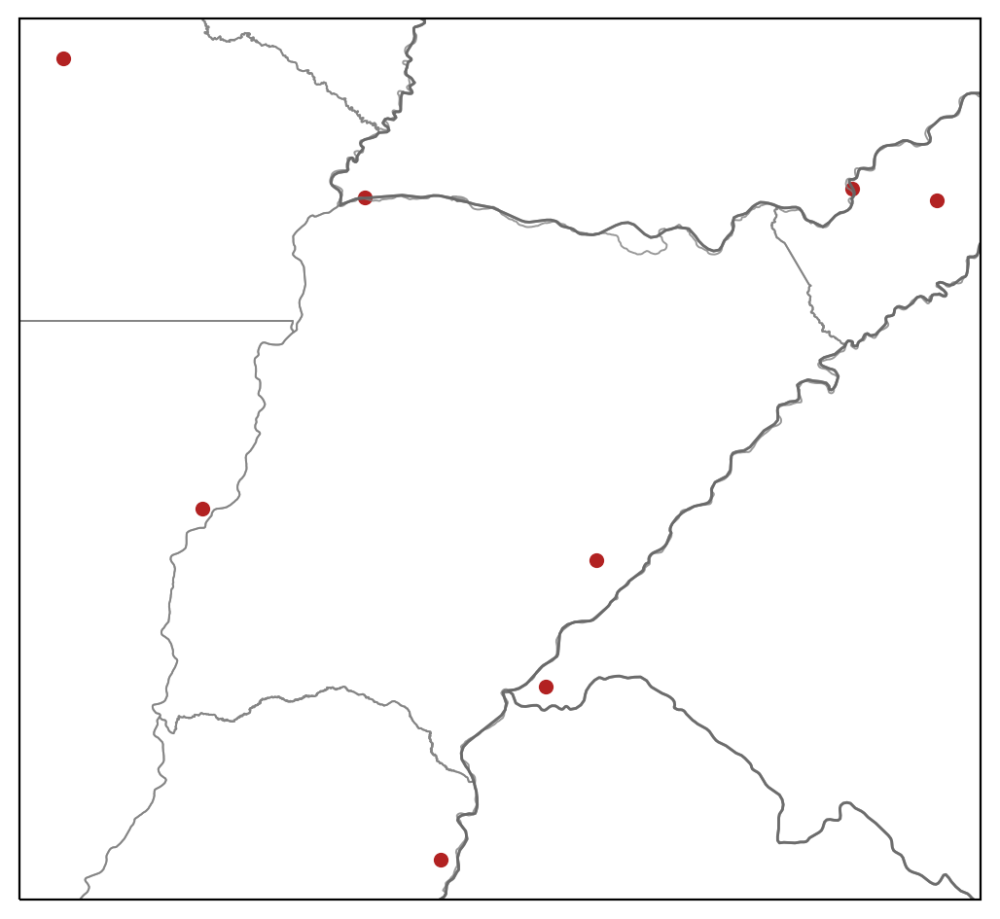

In [21]:
#inicio figura
fig1 = plt.figure(figsize = [10, 6], dpi = 200)    
ax = fig1.add_subplot(111, projection = ccrs.PlateCarree(central_longitude = 0)) #seteo proyeccion

#agrego geometrias de fondo: provincias y paises
ax.add_geometries(df_provincias(), crs = ccrs.PlateCarree(), facecolor = 'none', edgecolor = '0.5', linewidth = 0.7, alpha = 0.8)
ax.add_geometries(df_paises(), crs = ccrs.PlateCarree(), facecolor = 'none', edgecolor = '0.4', alpha = 0.8)

#grafico puntos
geodata3.plot(ax = ax, markersize = 20, c = "firebrick") 


In [22]:
#agrego etiquetas con numeros de estacion
list_smn_etiquetas = estaciones_ordenadas
for i, clave in enumerate(dict_puntos_smn_ordenados):
    ax.annotate(str(clave), list_smn_etiquetas[i], size = 8, weight='bold')



data_region.plot.contourf(ax=ax,levels=np.arange(valor_minimo, valor_maximo, delta_valor),extend='neither',
                                     transform=ccrs.PlateCarree(),cbar_kwargs={'label': "%"},cmap=cmocean.cm.rain)
ax.add_geometries(df_provincias(), crs=ccrs.PlateCarree(), facecolor='none',edgecolor='0.5', linewidth=0.7, alpha=0.9)
ax.add_geometries(df_paises(), crs=ccrs.PlateCarree(), facecolor='none',edgecolor='0.4', alpha=0.9)
ax.coastlines(color='0.3')

#ax.set_xlim(np.min(data_region.lon.values) - 360, np.max(data_region.lon.values)-360)
ax.set_xticklabels(np.arange(xticks_min, xticks_max)[::espacio_entre_lat_lon])
plt.xticks(np.arange(xticks_min, xticks_max)[::espacio_entre_lat_lon])
ax.set_xlabel("Lon")
ax.set_yticklabels(np.arange(yticks_min, yticks_max)[::espacio_entre_lat_lon])

#ax.set_ylim(np.min(data_region.lat.values), np.max(data_region.lat.values))
plt.yticks(np.arange(yticks_min, yticks_max)[::espacio_entre_lat_lon])
ax.set_ylabel("Lat")

plt.grid(linestyle="--", alpha=0.3)

plt.title(f"veo")
plt.show()

KeyError: 0

*Armo series de anomalias*

In [23]:
from f_procesamiento_nubosidad_observada_anomalias import f_serie_anomalias_mensuales, promedio_movil, tendencia, tendencia_theil_sen

In [24]:
medias_mensuales_anomalias = {}
for id_omm in ides_omm_ordenado:
    media_mensual_df = data_medias_mensuales[id_omm]
    climatologia_medias_mensuales_df = climatologia_medias_mensuales[id_omm]
    media_mensual_anomalia = f_serie_anomalias_mensuales(media_mensual_df, climatologia_medias_mensuales_df)
    medias_mensuales_anomalias[id_omm] = media_mensual_anomalia

In [25]:
from f_procesamiento_nubosidad_observada_anomalias import tendencia_theil_sen

def f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad(medias_anomalias_dict, estaciones_ordenadas, 
                                                               id_estacion,
                                                               fecha_inicio_str = "1983-12-15", 
                                                               fecha_final_str = "2016-11-15",
                                                               idioma = "ingles"):
    
    media_mensual_anomalias_data = medias_anomalias_dict[id_estacion]    
    nombre_estacion = estaciones_ordenadas[id_estacion]
    fig = plt.figure(num=1, figsize=(8, 5), dpi=600)
    if idioma == "ingles":
        plt.suptitle(f"Monthly mean total cloud cover anomaly (oktas) SMN \n {nombre_estacion} ({id_estacion})", size=14)
    elif idioma == "español":
        plt.suptitle(f"Anomalías de cobertura nubosa media mensual (octas) SMN \n {nombre_estacion} ({id_estacion})", size=14)
    ax = plt.gca()
    ax.set_facecolor('#E7E7DE')
    media_mensual_anomalias_data = media_mensual_anomalias_data.loc[fecha_inicio_str:fecha_final_str]
    plt.plot(media_mensual_anomalias_data, color = "k")

    tendencia_okta_sen = tendencia_theil_sen(media_mensual_anomalias_data[0])
    pendiente_sen = tendencia_okta_sen[1]
    origen_sen = tendencia_okta_sen[0]
    significativo_sen = tendencia_okta_sen[2]
    grafico_tendencia_sen = origen_sen + pendiente_sen * np.arange(0, len(media_mensual_anomalias_data.index), 1)
    if idioma == "ingles":
        ax.text(10000, 2.5, f"{round(pendiente_sen*10*12, 2)} okta/dec",color="red", 
                     ha="center", va = "center", fontsize =  'small',
                     weight='bold') #horizontalalignment='center', verticalalignment='center'
    elif idioma == "español":
        ax.text(10000, 2.5, f"{round(pendiente_sen*10*12, 2)} octa/dec",color="red", 
                     ha="center", va = "center", fontsize =  'small',
                     weight='bold') #horizontalalignment='center', verticalalignment='center'

    #grafico tendencia lineal por thail-sen
    if tendencia_okta_sen[2] == True:
        ax.plot(media_mensual_anomalias_data.index, 
                       grafico_tendencia_sen,
                       color = "red", alpha = 0.9)
    else:
        ax.plot(media_mensual_anomalias_data.index, 
                       grafico_tendencia_sen,
                       color = "red", alpha = 0.9, ls = ":")

    ylim = 3
    plt.ylim((-ylim,ylim))
    plt.yticks(np.arange(-ylim,ylim+1, 1))
    if idioma == "ingles":
        plt.ylabel("Okta")
        plt.xlabel("Date")  
    elif idioma == "español":
        plt.ylabel("Octa")
        plt.xlabel("Fecha") 
    plt.tight_layout()
    plt.savefig(f"lineplot_medias_mensuales_{id_omm}_{fecha_inicio_str}_{fecha_final_str}_{idioma}.png")
    plt.show


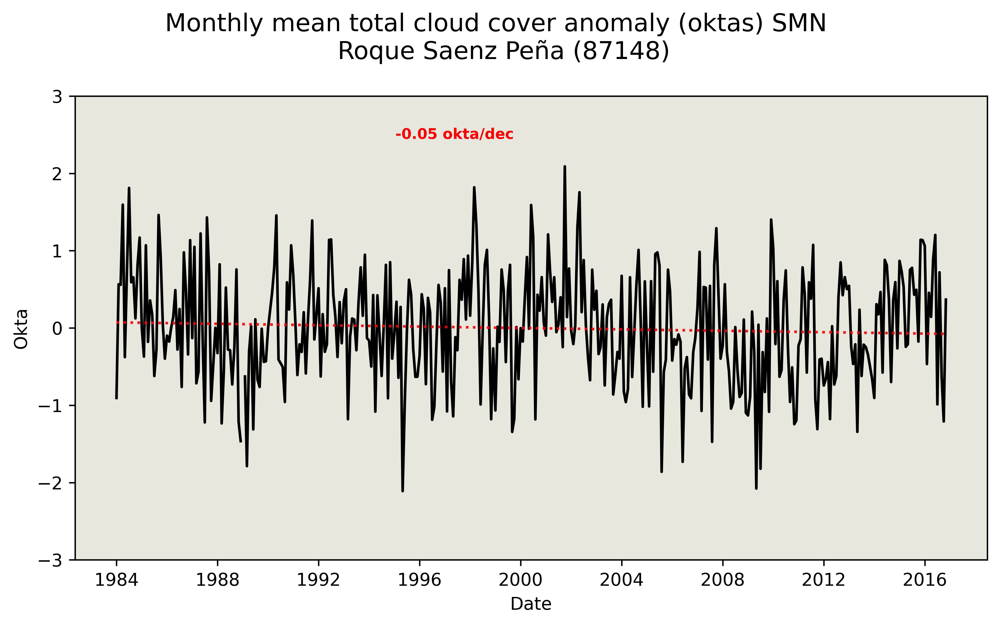

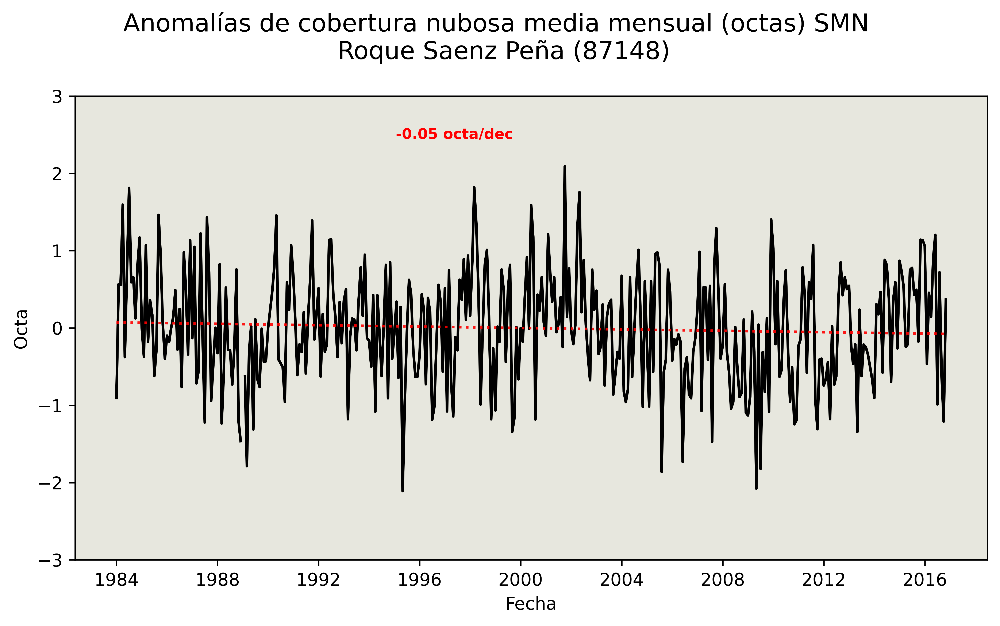

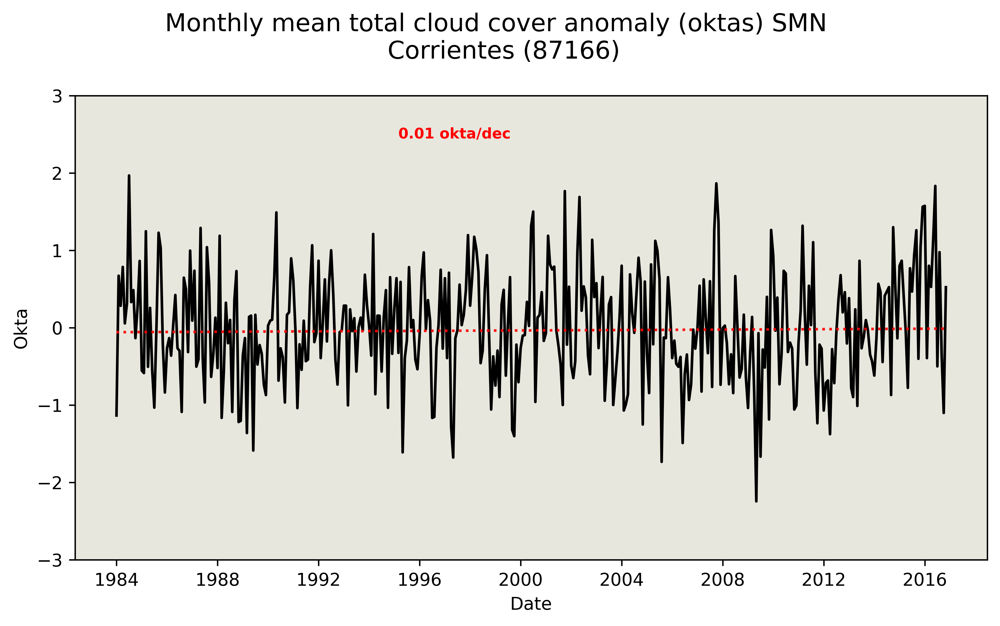

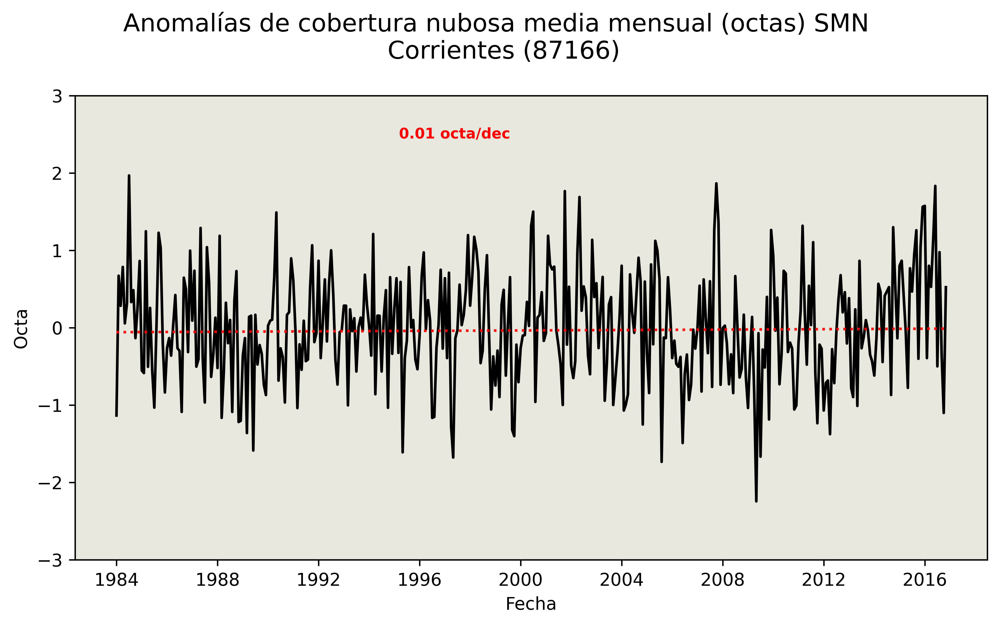

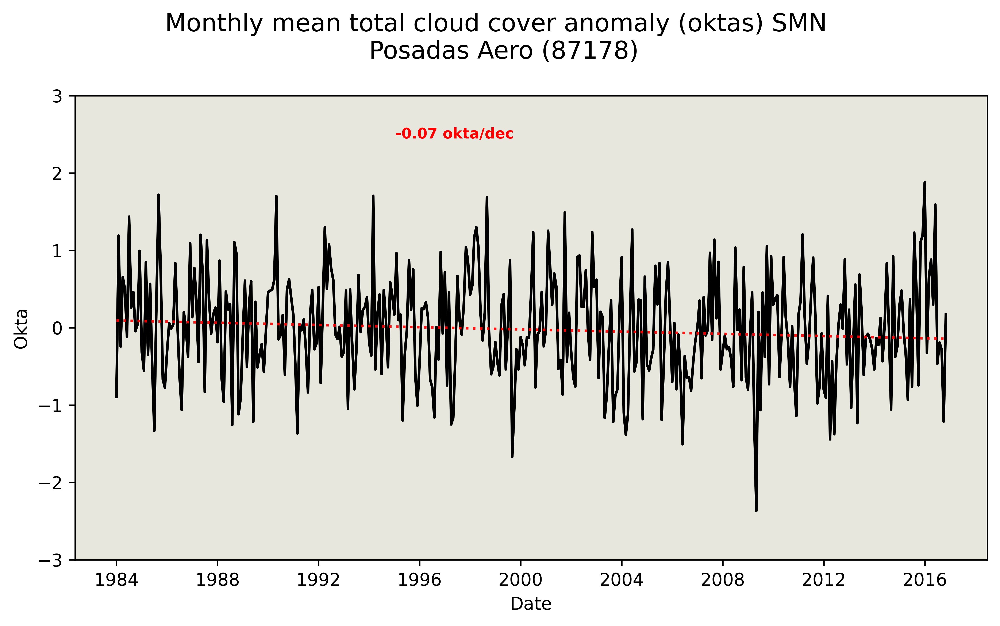

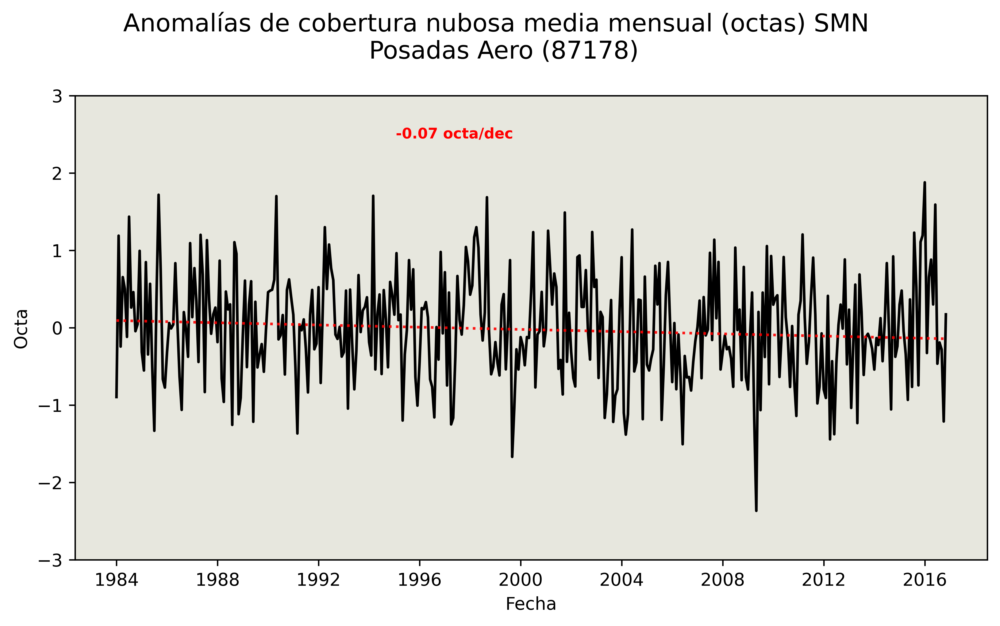

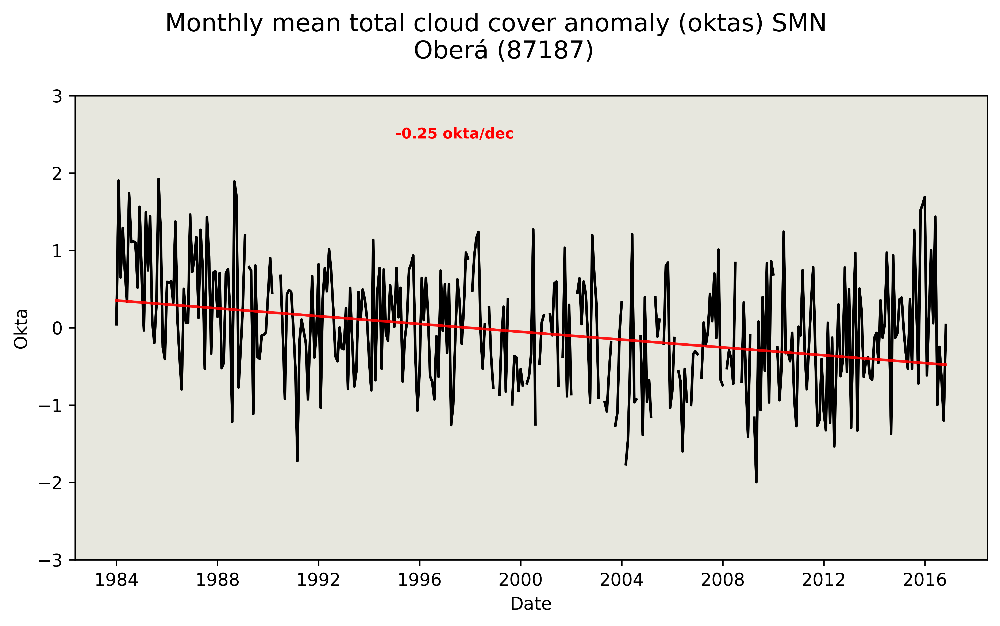

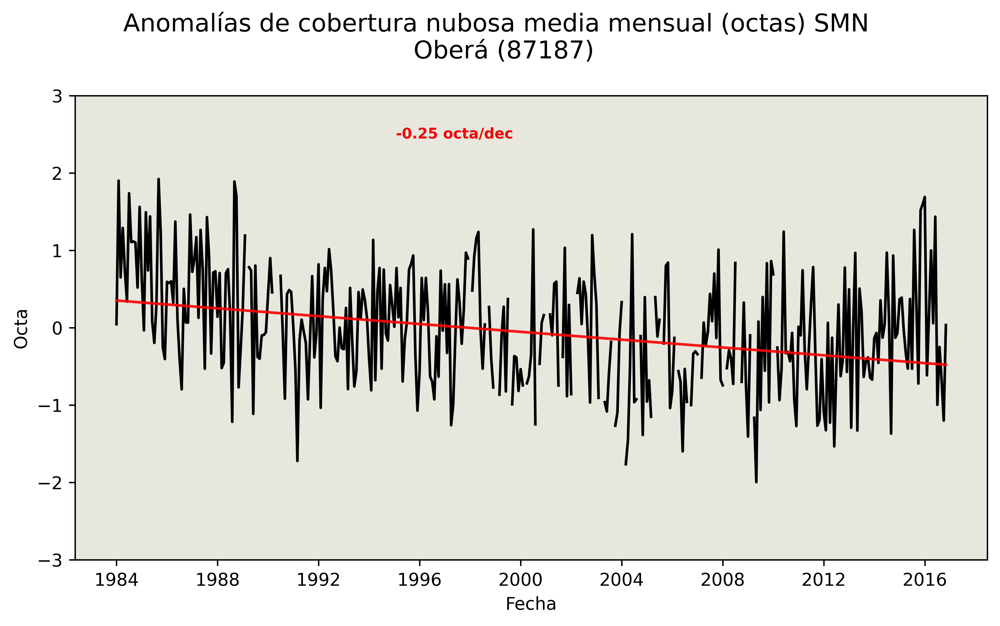

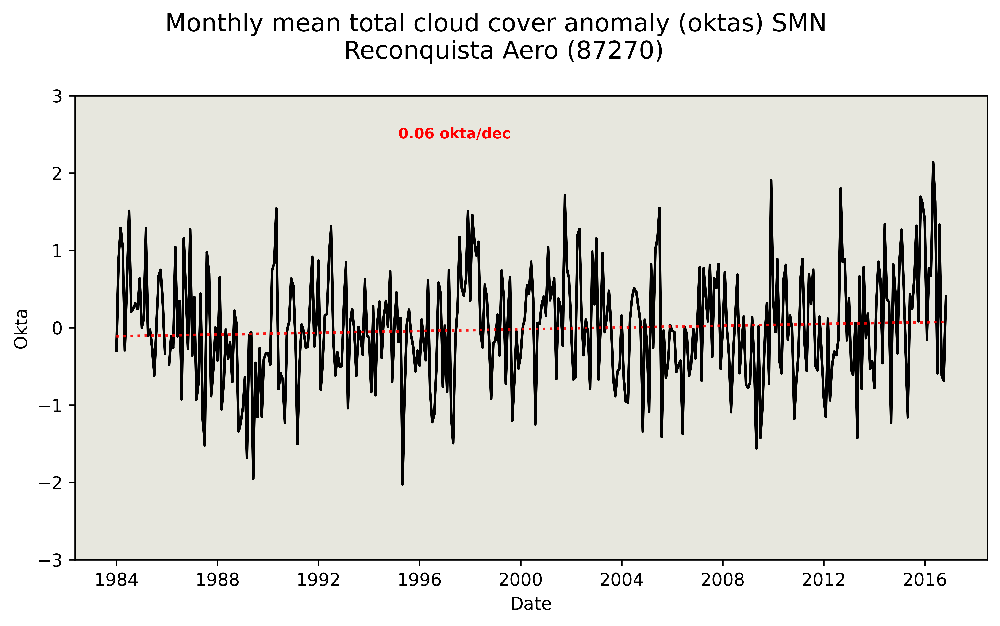

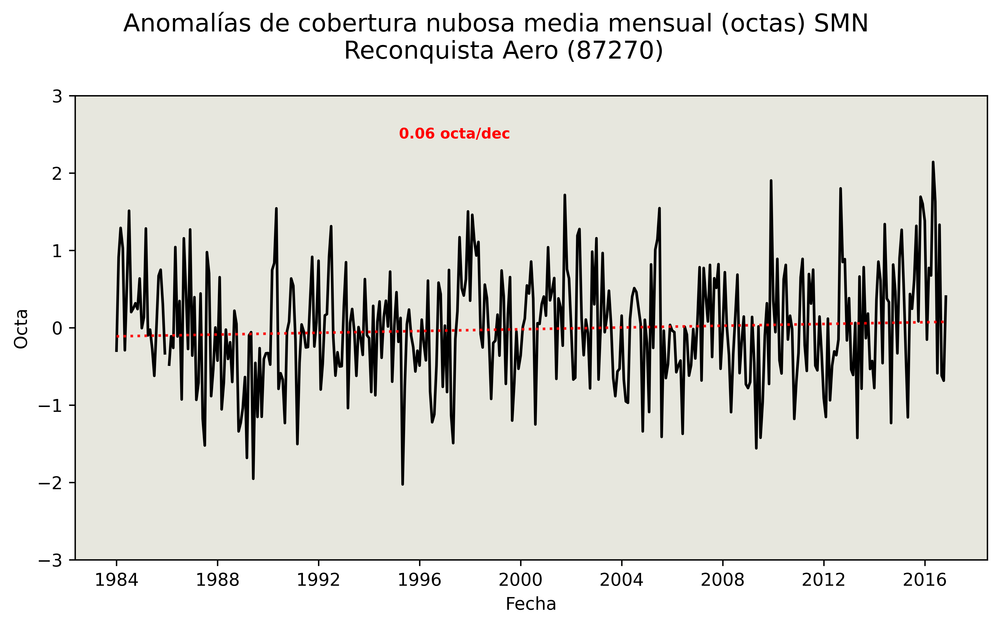

KeyboardInterrupt: 

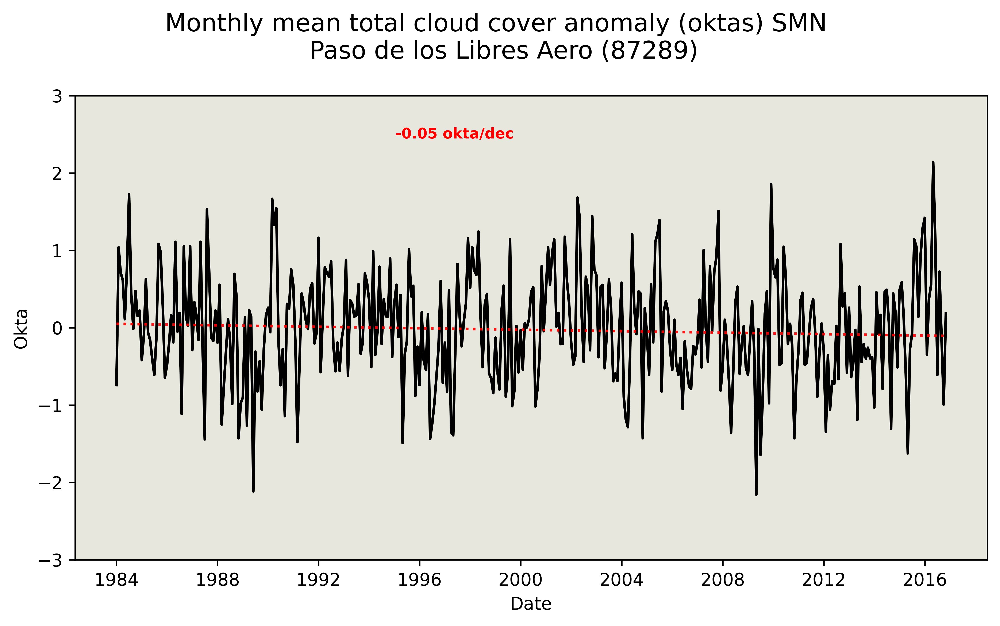

In [26]:
#if periodo_satelite: #periodo comun con satelite (Diciembre 1983 a Noviembre 2016)
fecha_inicio_str = "1983-12-15"
fecha_final_str = "2016-11-15"


for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad(medias_anomalias_dict = medias_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "ingles")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad(medias_anomalias_dict = medias_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "español")
    plt.show()
    plt.close()
    

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
    
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad(medias_anomalias_dict = medias_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "ingles")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad(medias_anomalias_dict = medias_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "español")
    plt.show()
    plt.close()

**Lo hago estacional**

*Promedio las anomalias mensuales calculadas previamente por cada estacion DJF, MAM, JJA, SON*

In [ ]:
medias_mensuales_anomalias_estacionales_todas_las_estaciones = {}

for id_omm in ides_omm_ordenado:
    
    medias_mensuales_anomalias_estacionales = {}
    df_data = medias_mensuales_anomalias[id_omm]

    for estacion in ["DJF", "MAM", "JJA", "SON"]:
        medias_estacion = []
        for anio in df_data.index.year.unique():#iterar sobre los anios

                data = df_data.loc[str(anio)]

                if estacion == "DJF":
                    if anio == df_data.index.year[0]:
                        data_estacion = np.nan
                        #media_estacion = np.nan #CORRER ESTO UNA VEZ SIN COMENTAR Y DESPUES COMENTARLO
                    else:
                        data_anio_previo = df_data.loc[str(anio-1)]
                        data_estacion = pd.concat([data_anio_previo[data_anio_previo.index.month == 12],
                                                   data[data.index.month ==1],data[data.index.month == 2]])
                        media_estacion = data_estacion.mean(axis = 0)

                elif estacion == "MAM":
                    data_estacion = pd.concat([data[data.index.month == 3],data[data.index.month == 4],data[data.index.month == 5]])
                    media_estacion = data_estacion.mean(axis = 0)

                elif estacion == "JJA":
                    data_estacion = pd.concat([data[data.index.month == 6],data[data.index.month == 7],data[data.index.month == 8]])
                    media_estacion = data_estacion.mean(axis = 0)

                elif estacion == "SON":
                    data_estacion = pd.concat([data[data.index.month == 9],data[data.index.month == 10],data[data.index.month == 11]])
                    media_estacion = data_estacion.mean(axis = 0)
                    
                medias_estacion.append(media_estacion)



        #if estacion == "DJF":
         #   indices = df_data.index.year.unique()[1: len(df_data.index.year.unique())] #se saca el primer año
        #else:
        indices = df_data.index.year.unique()


        media_mensual_anomalias_estacional_df = pd.DataFrame(medias_estacion)
        media_mensual_anomalias_estacional_df.index = indices
        medias_mensuales_anomalias_estacionales[estacion] = media_mensual_anomalias_estacional_df
    
    medias_mensuales_anomalias_estacionales_todas_las_estaciones[id_omm] = medias_mensuales_anomalias_estacionales

Grafico las series de anomalia media de nubosidad mensual para cada estacion del año junto con la tendencia de theil-sen correspondiente

In [ ]:
def f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(medias_anomalias_estacionales_dict, 
                                                                            estaciones_ordenadas, 
                                                                            id_estacion,
                                                                            fecha_inicio_str = "1983-12-15", 
                                                                            fecha_final_str = "2016-11-15",
                                                                            idioma = "ingles"):
    data_estacion = medias_anomalias_estacionales_dict[id_estacion] 
    nombre_estacion = estaciones_ordenadas[id_estacion]

    estaciones = ["DJF", "MAM", "JJA", "SON"]
    fig, ax = plt.subplots(2, 2, figsize=[9, 7], dpi=600)

    if idioma == "ingles":
        plt.suptitle(f"Monthly mean total cloud cover anomaly (oktas) SMN \n {nombre_estacion} ({id_estacion})", size=14)
    elif idioma == "español":
        plt.suptitle(f"Anomalías de cobertura nubosa media mensual (octas) SMN \n {nombre_estacion} ({id_estacion})", size=14)

    ylim = 2

    for i in range(0, 2):
                for j in range(0, 2):

                    datos_periodo = data_estacion[estaciones[2*i+j]].loc[fecha_inicio_str: fecha_final_str]
                    ax[i, j].set_facecolor('#E7E7DE')
                    ax[i, j].plot(datos_periodo.index,datos_periodo,color = "k")

                    #grafico tendencias
                    tendencia_okta_sen = tendencia_theil_sen(datos_periodo[0])
                    pendiente_sen = tendencia_okta_sen[1]
                    origen_sen = tendencia_okta_sen[0]
                    significativo_sen = tendencia_okta_sen[2]
                    grafico_tendencia_sen = origen_sen + pendiente_sen * np.arange(0, len(datos_periodo.index), 1)
                    if idioma == "ingles":
                        ax[i,j].text(1990, 1.7, f"{round(pendiente_sen*10, 2)} okta/dec",color="red", 
                                 ha="center", va = "center", fontsize =  'small',
                                 weight='bold') #horizontalalignment='center', verticalalignment='center'
                    elif idioma == "español":
                        ax[i,j].text(1990, 1.7, f"{round(pendiente_sen*10, 2)} octa/dec",color="red", 
                                 ha="center", va = "center", fontsize =  'small',
                                 weight='bold') #horizontalalignment='center', verticalalignment='center'

                    #grafico tendencia lineal por thail-sen
                    if tendencia_okta_sen[2] == True:
                        ax[i,j].plot(datos_periodo.index, grafico_tendencia_sen, color = "r", alpha = 0.9)
                    else:
                        ax[i,j].plot(datos_periodo.index, grafico_tendencia_sen, color = "r", alpha = 0.9, ls = ":")

                    ax[i, j].set_ylim((-ylim,ylim))
                    ax[i, j].set_yticks(np.arange(-ylim,ylim+1, 1))
                    if idioma == "ingles":
                        ax[i, j].set_title(f"{estaciones[2*i+j]}", size = 11)
                    elif idioma == "español":
                        ax[i, j].set_title(f"{estaciones[2*i+j]}", size = 11)
                    if j == 0: #solo para los del lateral izquierdo pongo el ylabel
                        if idioma == "ingles":
                            ax[i, j].set_ylabel("Okta")
                        elif idioma == "español":
                            ax[i, j].set_ylabel("Octa")
                    else:
                        ax[i, j].set_yticklabels([])
                    if i == 1: #solo para los de abajo pongo el xlabel
                        if idioma == "ingles":
                            ax[i, j].set_xlabel("Year")
                        elif idioma == "español":
                            ax[i, j].set_xlabel("Año")
                        ax[i,j].set_xticks(datos_periodo.index[::8])
                        ax[i,j].set_xticklabels(datos_periodo.index[::8])
                        #ax[i,j].set_xticklabels(frecuencias.index)
                    else:
                        ax[i,j].set_xticks(datos_periodo.index[::8])
                        ax[i, j].set_xticklabels([])

    fig.tight_layout()
    plt.savefig(f"lineplot_medias_mensuales_por_estacion_{id_omm}_{fecha_inicio_str}_{fecha_final_str}_{idioma}.png")
    plt.show


In [ ]:
fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(medias_anomalias_estacionales_dict = medias_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "ingles")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(medias_anomalias_estacionales_dict = medias_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "español")
    plt.show()
    plt.close()
    

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(medias_anomalias_estacionales_dict = medias_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "ingles")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(medias_anomalias_estacionales_dict = medias_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "español")
    plt.show()
    plt.close()

**Armo tablas con los valores de las tendencias**

In [ ]:
def f_tabla_tendencias_nubosidad_media(medias_mensuales_anomalias,
                                       fecha_inicio_str, fecha_final_str, 
                                       estaciones_ordenadas, ides_omm_ordenado):
    numRows = len(ides_omm_ordenado)
    numCols = 1

    tabla_tendencias = pd.DataFrame(index=range(numRows),columns=range(numCols))
    tabla_tendencias_significativas = pd.DataFrame(index=range(numRows),columns=range(numCols))
    for j, id_omm in enumerate(ides_omm_ordenado):

        medias_mensuales_anomalias_estacion = medias_mensuales_anomalias[id_omm]
        medias_mensuales_anomalias_fechas = medias_mensuales_anomalias_estacion.loc[fecha_inicio_str:fecha_final_str]
        
        tendencia = tendencia_theil_sen(medias_mensuales_anomalias_fechas[0])
        pendiente = tendencia[1]*10*12 #decadal
        significativo = tendencia[2]
        tabla_tendencias.iloc[j,0] = round(pendiente, 2) #filas, columnas
        tabla_tendencias_significativas.iloc[j,0] = significativo

    tabla_tendencias.index =  list(estaciones_ordenadas.values())
    tabla_tendencias.columns = ["Media mensual"]
    tabla_tendencias_significativas.index = list(estaciones_ordenadas.values())
    tabla_tendencias_significativas.columns = ["Media mensual"]
    print(tabla_tendencias)
    print(tabla_tendencias_significativas)
    #guardo
    
    tabla_tendencias.to_excel(f"tabla_tendencias_media_mensual_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    tabla_tendencias_significativas.to_excel(f"tabla_tendencias_media_mensual_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    
    return(print(f"Se generaron tablas de tendencias de medias mensuales de nubosidad para el periodo {fecha_inicio_str}_{fecha_final_str}"))


In [ ]:
fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
f_tabla_tendencias_nubosidad_media(medias_mensuales_anomalias = medias_mensuales_anomalias,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado)

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
f_tabla_tendencias_nubosidad_media(medias_mensuales_anomalias = medias_mensuales_anomalias,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado)

In [ ]:
def f_tabla_tendencias_nubosidad_media_estaciones(medias_mensuales_anomalias_por_estacion,
                                       fecha_inicio_str, fecha_final_str, 
                                       estaciones_ordenadas, ides_omm_ordenado):
    numRows = len(ides_omm_ordenado)
    numCols = 4

    tabla_tendencias = pd.DataFrame(index=range(numRows),columns=range(numCols))
    tabla_tendencias_significativas = pd.DataFrame(index=range(numRows),columns=range(numCols))
    for j, id_omm in enumerate(ides_omm_ordenado):

        medias_mensuales_anomalias_estacion = medias_mensuales_anomalias_por_estacion[id_omm]
        
        #DJF
        for i, estacion_del_anio in enumerate(["DJF", "MAM", "JJA", "SON"]):
            medias_mensuales_anomalias_fechas = medias_mensuales_anomalias_estacion[estacion_del_anio].loc[fecha_inicio_str:fecha_final_str]
            
            tendencia = tendencia_theil_sen(medias_mensuales_anomalias_fechas[0])
            pendiente = tendencia[1]*10 #decadal
            significativo = tendencia[2]
            tabla_tendencias.iloc[j,i] = round(pendiente, 2) #filas, columnas
            tabla_tendencias_significativas.iloc[j,i] = significativo
        
    tabla_tendencias.index =  list(estaciones_ordenadas.values())
    tabla_tendencias.columns = [["Media DJF (octa/dec)", "Media MAM (octa/dec)", "Media JJA (octa/dec)", "Media SON (octa/dec)"]]
    tabla_tendencias_significativas.index = list(estaciones_ordenadas.values())
    tabla_tendencias_significativas.columns = [["Media DJF (octa/dec)", "Media MAM (octa/dec)", "Media JJA (octa/dec)", "Media SON (octa/dec)"]]
    print(tabla_tendencias)
    print(tabla_tendencias_significativas)
    ##guardo
    
    tabla_tendencias.to_excel(f"tabla_tendencias_media_mensual_estaciones_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    tabla_tendencias_significativas.to_excel(f"tabla_tendencias_media_mensual_estaciones_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    
    return(print(f"Se generaron tablas de tendencias de medias mensuales por estacion de nubosidad para el periodo {fecha_inicio_str}_{fecha_final_str}"))


In [ ]:
fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
f_tabla_tendencias_nubosidad_media_estaciones(medias_mensuales_anomalias_por_estacion = medias_mensuales_anomalias_estacionales_todas_las_estaciones,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado)

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
f_tabla_tendencias_nubosidad_media_estaciones(medias_mensuales_anomalias_por_estacion = medias_mensuales_anomalias_estacionales_todas_las_estaciones,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado)

--------------------------

### Armo indices

Se define al parámetro de nubosidad PC (computado en %):

PC = 50 + 50 (N8 - N0) / Ntot

Donde:

* N8 = numero de observaciones con octa 8
* N0 = numero de observaciones con octa 0
* N = numero de observaciones del periodo a considerar

Tomo como periodo 1 mes y observaciones diarias, entonces:

* N8 = numero de dias con octa 8 en el mes
* N0 = numero de dias con octa 0 en el mes
* N = numero de dias del mes


--------------------------

**Busco indices alternativos considerando octas intermedias:**

Se define al parámetro de nubosidad PC2 (computado en %):

PC = 50 + 50 (N8 + N7 + N6 - N2 - N1 - N0 ) / Ntot

Donde:

* N8 = numero de observaciones con octa 8
* N7 = numero de observaciones con octa 7
* N6 = numero de observaciones con octa 6
* N2 = numero de observaciones con octa 2
* N1 = numero de observaciones con octa 1
* N0 = numero de observaciones con octa 0
* N = numero de observaciones del periodo a considerar

Tomo como periodo 1 mes y observaciones diarias, entonces:

* N8 = numero de dias con octa 8 en el mes
* N7 = numero de dias con octa 7 en el mes
* N6 = numero de dias con octa 6 en el mes
* N2 = numero de dias con octa 2 en el mes
* N1 = numero de dias con octa 1 en el mes
* N0 = numero de dias con octa 0 en el mes
* N = numero de dias del mes

Solo computo estos índices si menos del 20% de los datos son faltantes


**Hago PC**

In [ ]:
import datetime as dt

os.chdir("../") #se mueve uno atras: a admite_porc_na
print("-----------------") 
if "datos" not in os.listdir():
    print(f"genera directorio llamado: datos en {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na")
    os.mkdir("datos")
print(f"se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na/datos")
os.chdir("./datos") #se para en datos, aca se van a guardar los resultados 
print("-----------------")    

data_PC_mensuales = {} #genero diccionario donde se van a guardar las frecuencias mensuales

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    ##abro o genero archivo con frecuencias
    #if f"media_mensual_{id_omm}.csv" not in os.listdir():
    print(f"genera un archivo: PC_meses_{id_omm}.csv en {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na/datos")
    df_data = data[id_omm]
    PC = []
    indices = []
    for anio in df_data.index.year.unique():#iterar sobre los anios
        data_anio = df_data.loc[str(anio)]
        for month in data_anio.index.month.unique():
            data_mes = data_anio[data_anio.index.month == month]
            data_mes_values = data_mes.value_counts()
            cantidad_datos_mes = data_mes.count()[0]
            cantidad_datos_faltantes_mes = data_mes.isnull().sum().values[0]
            if (cantidad_datos_faltantes_mes >= cantidad_datos_mes * 0.2): #si hay mas del 20% de datos faltantes computa PC como na
                PC_anio_mes = np.nan
            else:
                #N8
                if (8.0,) in data_mes_values.index:
                    N8 = data_mes_values.loc[8].values[0]
                else:
                    N8 = 0
                #N0
                if (0.0,) in data_mes_values.index:
                    N0 = data_mes_values.loc[0].values[0]
                else:
                    N0 = 0
                Ntot = cantidad_datos_mes
                PC_anio_mes = 50 + 50 * (N8 - N0) / Ntot
            PC.append(PC_anio_mes) 
            indices.append(dt.date(anio,month,1))     
    PC_guardo = pd.DataFrame(PC)
    PC_guardo.index = indices
    PC_guardo.to_csv(os.path.join(".", f"PC_meses_{id_omm}.csv"))
    #else:
     #   media_mensual = pd.read_csv(f"media_mensual_{id_omm}.csv", index_col="fecha")

    #lo acomodo en diccionarios
    data_PC_mensuales[id_omm] = PC_guardo

print("Se generaron diccionarios con data frames de PC mensuales para cada estacion")
print("Cada elemento de esos diccionarios (un elemento por estacion) tiene esta pinta:")
print("-----------------") 
print("PC mensuales:")
print(data_PC_mensuales[87166].iloc[0:12])
print("-----------------") 


**Hago PC2**

In [ ]:
import datetime as dt

os.chdir("../") #se mueve uno atras: a admite_porc_na
print("-----------------") 
if "datos" not in os.listdir():
    print(f"genera directorio llamado: datos en {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na")
    os.mkdir("datos")
print(f"se para en el directorio llamado: {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na/datos")
os.chdir("./datos") #se para en datos, aca se van a guardar los resultados 
print("-----------------")    

data_PC2_mensuales = {} #genero diccionario donde se van a guardar las frecuencias mensuales

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    ##abro o genero archivo con frecuencias
    #if f"media_mensual_{id_omm}.csv" not in os.listdir():
    print(f"genera un archivo: PC2_meses_{id_omm}.csv en {ruta_a_resultados}nubosidad_observada/smn/data_mensual/admite_{porcentaje_na_admitido}porc_na/datos")
    df_data = data[id_omm]
    PC2 = []
    indices = []
    for anio in df_data.index.year.unique():#iterar sobre los anios
        data_anio = df_data.loc[str(anio)]
        for month in data_anio.index.month.unique():
            data_mes = data_anio[data_anio.index.month == month]
            data_mes_values = data_mes.value_counts()
            cantidad_datos_mes = data_mes.count()[0]
            cantidad_datos_faltantes_mes = data_mes.isnull().sum().values[0]
            if (cantidad_datos_faltantes_mes >= cantidad_datos_mes * 0.2): #si hay mas del 20% de datos faltantes computa PC como na
                PC2_anio_mes = np.nan
            else:
                #N8
                if (8.0,) in data_mes_values.index:
                    N8 = data_mes_values.loc[8].values[0]
                else:
                    N8 = 0
                    
                #N7
                if (7.0,) in data_mes_values.index:
                    N7 = data_mes_values.loc[7].values[0]
                else:
                    N7 = 0
                
                #N6
                if (6.0,) in data_mes_values.index:
                    N6 = data_mes_values.loc[6].values[0]
                else:
                    N6 = 0
                
                #N2
                if (2.0,) in data_mes_values.index:
                    N2 = data_mes_values.loc[2].values[0]
                else:
                    N2 = 0
                
                #N1
                if (1.0,) in data_mes_values.index:
                    N1 = data_mes_values.loc[1].values[0]
                else:
                    N1 = 0
            
                #N0
                if (0.0,) in data_mes_values.index:
                    N0 = data_mes_values.loc[0].values[0]
                else:
                    N0 = 0
                Ntot = cantidad_datos_mes
                PC2_anio_mes = 50 + 50 * (N8 + N7 + N6 - N2 -N1 - N0) / Ntot
            PC2.append(PC2_anio_mes) 
            indices.append(dt.date(anio,month,1))     
    PC2_guardo = pd.DataFrame(PC2)
    PC2_guardo.index = indices
    PC2_guardo.to_csv(os.path.join(".", f"PC2_meses_{id_omm}.csv"))
    #else:
     #   media_mensual = pd.read_csv(f"media_mensual_{id_omm}.csv", index_col="fecha")

    #lo acomodo en diccionarios
    data_PC2_mensuales[id_omm] = PC2_guardo

print("Se generaron diccionarios con data frames de PC2 mensuales para cada estacion")
print("Cada elemento de esos diccionarios (un elemento por estacion) tiene esta pinta:")
print("-----------------") 
print("PC2 mensuales:")
print(data_PC2_mensuales[87166].iloc[0:12])
print("-----------------") 


**Calculo climatologías y anomalias de PC y PC2**

Lo hago de manera análoga a lo que hice con las medias

In [ ]:
climatologia_PC_mensuales = {} 

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    #calculo climatologia
    PC_mensual_df = data_PC_mensuales[id_omm]
    PC_mensual_df.index = pd.to_datetime(PC_mensual_df.index)
    PC_mensual_fechas_climatologia = PC_mensual_df.loc[fecha_inicio_climatologia_str:fecha_final_climatologia_str]
    PC_mensual_climatologia = PC_mensual_fechas_climatologia.groupby(PC_mensual_fechas_climatologia.index.month).mean() 
    PC_mensual_climatologia
    #Lo guardo en diccionario: climatologia_medias_mensuales
    climatologia_PC_mensuales[id_omm] = PC_mensual_climatologia

climatologia_PC2_mensuales = {} 

#para cada id_omm_ordenado
for id_omm in ides_omm_ordenado:
    #calculo climatologia
    PC2_mensual_df = data_PC2_mensuales[id_omm]
    PC2_mensual_df.index = pd.to_datetime(PC2_mensual_df.index)
    PC2_mensual_fechas_climatologia = PC2_mensual_df.loc[fecha_inicio_climatologia_str:fecha_final_climatologia_str]
    PC2_mensual_climatologia = PC2_mensual_fechas_climatologia.groupby(PC2_mensual_fechas_climatologia.index.month).mean() 
    PC2_mensual_climatologia
    #Lo guardo en diccionario: climatologia_medias_mensuales
    climatologia_PC2_mensuales[id_omm] = PC2_mensual_climatologia
    

**Grafico climatologias de PC y PC2**

In [ ]:
def plot_barras_climatologia(PC, estaciones, id_estacion,
                             anio_inicio = 1983, anio_final = 2016,
                             idioma = "ingles", PC_o_PC2 = "PC"):
    
    nombre_estacion = estaciones[id_estacion]
    
    width = 0.98      #ancho de las barras
    if idioma == "ingles":
        meses = ['J', 'F', 'M', 'A', 'M', "J", "J", "A", "S", "O","N", "D"] #inicial meses
    elif idioma == "español":
        meses = ['E', 'F', 'M', 'A', 'M', "J", "J", "A", "S", "O","N", "D"] #inicial meses
    
    
    plt.figure(num=1, figsize=(8, 5), dpi=600) #genero figura
    ax = plt.gca()
    ax.set_facecolor('#E7E7DE') #seteo color de fondo
    ax.bar(PC.index, PC[0], width,color = "k")
    
    
    if idioma == "ingles":
        ax.set_ylabel(f'Monthly {PC_o_PC2} (%)')
    elif idioma == "español":
        ax.set_ylabel(f'{PC_o_PC2} mensual (%)')
    
    plt.ylim(0, 100)
    plt.xlim(PC.index[0]-0.5, PC.index[-1]+0.5)
    ax.set_xticks(PC.index)
    ax.set_xticklabels(meses)
    
    if idioma == "ingles":
        plt.xlabel("Month")
        plt.title(f"Climatology of monthly {PC_o_PC2} (%) ({anio_inicio}-{anio_final}) SMN \n {nombre_estacion} ({id_estacion})")
    elif idioma == "español":
        plt.xlabel("Mes")
        plt.title(f"Climatología de {PC_o_PC2} mensual (%) ({anio_inicio}-{anio_final}) SMN \n {nombre_estacion} ({id_estacion})")
    
    plt.savefig(f"climatologia_PC_{id_estacion}_{idioma}.png")
    plt.show()

In [ ]:
for id_omm in ides_omm_ordenado:
    plot_barras_climatologia(climatologia_PC_mensuales[id_omm], estaciones_ordenadas, id_estacion = id_omm,
                                 anio_inicio = 1983, anio_final = 2016,
                                 idioma = "español", PC_o_PC2 = "PC")
    plot_barras_climatologia(climatologia_PC_mensuales[id_omm], estaciones_ordenadas, id_estacion = id_omm,
                                 anio_inicio = 1983, anio_final = 2016,
                                 idioma = "ingles", PC_o_PC2 = "PC")
    plot_barras_climatologia(climatologia_PC2_mensuales[id_omm], estaciones_ordenadas, id_estacion = id_omm,
                                 anio_inicio = 1983, anio_final = 2016,
                                 idioma = "español", PC_o_PC2 = "PC2")
    plot_barras_climatologia(climatologia_PC2_mensuales[id_omm], estaciones_ordenadas, id_estacion = id_omm,
                                 anio_inicio = 1983, anio_final = 2016,
                                 idioma = "ingles", PC_o_PC2 = "PC2")

**Calculo anomalias**

Analogo a lo que hice con las medias

In [ ]:
PC_mensuales_anomalias = {}
for id_omm in ides_omm_ordenado:
    PC_mensual_df = data_PC_mensuales[id_omm]
    climatologia_PC_mensuales_df = climatologia_PC_mensuales[id_omm]
    PC_mensual_anomalia = f_serie_anomalias_mensuales(PC_mensual_df, climatologia_PC_mensuales_df)
    PC_mensuales_anomalias[id_omm] = PC_mensual_anomalia

PC2_mensuales_anomalias = {}
for id_omm in ides_omm_ordenado:
    PC2_mensual_df = data_PC2_mensuales[id_omm]
    climatologia_PC2_mensuales_df = climatologia_PC2_mensuales[id_omm]
    PC2_mensual_anomalia = f_serie_anomalias_mensuales(PC2_mensual_df, climatologia_PC2_mensuales_df)
    PC2_mensuales_anomalias[id_omm] = PC2_mensual_anomalia
    

**Veo como se relacionan la media mensual con PC y PC2 mensuales**

Calculo recta de regreción y coeficiente de correlacion 

In [ ]:
def plot_cor_PC_media_anomalias(medias_dict, PC_dict, estaciones, id_estacion,
                     idioma = "ingles", PC_o_PC2 = "PC"):
    #medias_dict = data_medias_mensuales
    #PC_dict = data_PC_mensuales
    
    nombre_estacion = estaciones[id_estacion]
    
    #datos
    x = medias_dict[id_estacion][0].values
    y = PC_dict[id_estacion][0].values
    
    #calculo recta de regresion
    idx = np.isfinite(x) & np.isfinite(y)
    m, b = np.polyfit(x[idx], y[idx], 1) #m = slope, b=intercept
    
    #calculo R2
    correlation = np.corrcoef(x[idx], y[idx])[0,1]
    r_squared = correlation**2

    plt.figure(num=1, figsize=(8, 5), dpi=600) #genero figura
    ax = plt.gca()
    ax.set_facecolor('#E7E7DE') #seteo color de fondo
    ax.scatter(x, y, c ="k", alpha = 0.7)
    ax.plot(x, m*x + b, c = "r")
    ax.text(0, 35, '$R^2$ = %0.2f' % r_squared, c= "r", fontweight = 800)
    
    if idioma == "ingles":
        ax.set_xlabel('Cloud cover monthly mean anomaly (oktas)')
        ax.set_ylabel(f'Monthly {PC_o_PC2} anomaly (%)')
    elif idioma == "español":
        ax.set_xlabel('Anomalía de cobertura nubosa media mensual (octas)')
        ax.set_ylabel(f'Anomalía de {PC_o_PC2} mensual(%)')
    
    plt.ylim(-50, 50)
    plt.xlim(-4, 4)
    
    if idioma == "ingles":
        plt.title(f"Cloud cover monthly mean (oktas) vs monthly {PC_o_PC2} (%) - anomalies SMN \n {nombre_estacion} ({id_estacion})")
    elif idioma == "español":
        plt.title(f"Cobertura nubosa media mensual (octas) vs {PC_o_PC2} mensual (%) - anomalías SMN \n {nombre_estacion} ({id_estacion})")
    
    plt.savefig(f"media_nubosidad_vs_{PC_o_PC2}_anomalias_{id_estacion}_{idioma}.png")
    plt.show()

In [ ]:
def plot_cor_PC_media_anomalias_paper(medias_dict, PC_dict, estaciones, id_estacion,
                     idioma = "ingles", PC_o_PC2 = "PC"):
    #medias_dict = data_medias_mensuales
    #PC_dict = data_PC_mensuales
    
    nombre_estacion = estaciones[id_estacion]
    
    #datos
    x = medias_dict[id_estacion][0].values
    y = PC_dict[id_estacion][0].values
    
    #calculo recta de regresion
    idx = np.isfinite(x) & np.isfinite(y)
    m, b = np.polyfit(x[idx], y[idx], 1) #m = slope, b=intercept
    
    #calculo R2
    correlation = np.corrcoef(x[idx], y[idx])[0,1]
    r_squared = correlation**2

    plt.figure(num=1, figsize=(8, 5), dpi=600) #genero figura
    ax = plt.gca()
    #ax.set_facecolor('#E7E7DE') #seteo color de fondo
    ax.scatter(x, y, c ="k", alpha = 0.7)
    ax.plot(x, m*x + b, c = "firebrick")
    ax.text(0, 35, '$R^2$ = %0.2f' % r_squared, c= "firebrick", fontweight = 800)
    
    if idioma == "ingles":
        ax.set_xlabel('Monthly cloud cover anomaly (oktas)')
        ax.set_ylabel(f'Monthly {PC_o_PC2} anomaly (%)')
    elif idioma == "español":
        ax.set_xlabel('Anomalía de cobertura nubosa media mensual (octas)')
        ax.set_ylabel(f'Anomalía de {PC_o_PC2} mensual(%)')
    
    plt.ylim(-50, 50)
    plt.xlim(-4, 4)
    
    if idioma == "ingles":
        plt.title(f"{nombre_estacion} ({id_estacion})")
    elif idioma == "español":
        plt.title(f"{nombre_estacion} ({id_estacion})")
    
    plt.savefig(f"media_nubosidad_vs_{PC_o_PC2}_anomalias_{id_estacion}_{idioma}_paper.png")
    plt.show()

In [ ]:
for id_estacion in ides_omm_ordenado:
    plot_cor_PC_media_anomalias(medias_mensuales_anomalias, PC_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "español", PC_o_PC2 = "PC")
    plot_cor_PC_media_anomalias(medias_mensuales_anomalias, PC_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "ingles", PC_o_PC2 = "PC")
    plot_cor_PC_media_anomalias(medias_mensuales_anomalias, PC2_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "español", PC_o_PC2 = "PC2")
    plot_cor_PC_media_anomalias(medias_mensuales_anomalias, PC2_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "ingles", PC_o_PC2 = "PC2")


In [ ]:
for id_estacion in ides_omm_ordenado:
    plot_cor_PC_media_anomalias_paper(medias_mensuales_anomalias, PC_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "español", PC_o_PC2 = "PC")
    plot_cor_PC_media_anomalias_paper(medias_mensuales_anomalias, PC_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "ingles", PC_o_PC2 = "PC")
    plot_cor_PC_media_anomalias_paper(medias_mensuales_anomalias, PC2_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "español", PC_o_PC2 = "PC2")
    plot_cor_PC_media_anomalias_paper(medias_mensuales_anomalias, PC2_mensuales_anomalias, estaciones_ordenadas, id_estacion,
                         idioma = "ingles", PC_o_PC2 = "PC2")

**Ahora si, grafico las series de anomalia de PC y PC2 junto con la tendencia**

In [ ]:
from f_procesamiento_nubosidad_observada_anomalias import tendencia_theil_sen

def f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict, estaciones_ordenadas, 
                                                               id_estacion,
                                                               fecha_inicio_str = "1983-12-15", 
                                                               fecha_final_str = "2016-11-15",
                                                               idioma = "ingles", PC_o_PC2 = "PC"):
    
    PC_mensual_anomalias_data = PC_anomalias_dict[id_estacion]    
    nombre_estacion = estaciones_ordenadas[id_estacion]
    fig = plt.figure(num=1, figsize=(8, 5), dpi=600)
    if idioma == "ingles":
        plt.suptitle(f"Monthly {PC_o_PC2} (%) anomalies SMN \n {nombre_estacion} ({id_estacion})", size=14)
    elif idioma == "español":
        plt.suptitle(f"Anomalías de {PC_o_PC2} mensual (%) SMN \n {nombre_estacion} ({id_estacion})", size=14)
    ax = plt.gca()
    ax.set_facecolor('#E7E7DE')
    PC_mensual_anomalias_data = PC_mensual_anomalias_data.loc[fecha_inicio_str:fecha_final_str]
    plt.plot(PC_mensual_anomalias_data, color = "k")

    tendencia_okta_sen = tendencia_theil_sen(PC_mensual_anomalias_data[0])
    pendiente_sen = tendencia_okta_sen[1]
    origen_sen = tendencia_okta_sen[0]
    significativo_sen = tendencia_okta_sen[2]
    grafico_tendencia_sen = origen_sen + pendiente_sen * np.arange(0, len(PC_mensual_anomalias_data.index), 1)
    if idioma == "ingles":
        ax.text(11000, 30, f"{round(pendiente_sen*10*12, 2)} %/dec",color="red", 
                     ha="center", va = "center", fontsize =  'small',
                     weight='bold') #horizontalalignment='center', verticalalignment='center'
    elif idioma == "español":
        ax.text(11000, 30, f"{round(pendiente_sen*10*12, 2)} %/dec",color="red", 
                     ha="center", va = "center", fontsize =  'small',
                     weight='bold') #horizontalalignment='center', verticalalignment='center'

    #grafico tendencia lineal por thail-sen
    if tendencia_okta_sen[2] == True:
        ax.plot(PC_mensual_anomalias_data.index, 
                       grafico_tendencia_sen,
                       color = "red", alpha = 0.9)
    else:
        ax.plot(PC_mensual_anomalias_data.index, 
                       grafico_tendencia_sen,
                       color = "red", alpha = 0.9, ls = ":")

    ylim = 40
    plt.ylim((-ylim,ylim))
    plt.yticks(np.arange(-ylim,ylim+1, 10))
    if idioma == "ingles":
        plt.ylabel(f"Monthly {PC_o_PC2} (%)")
        plt.xlabel("Date")  
    elif idioma == "español":
        plt.ylabel(f"{PC_o_PC2} mensual (%)")
        plt.xlabel("Fecha") 
    plt.tight_layout()
    plt.savefig(f"lineplot_{PC_o_PC2}_mensuales_{id_omm}_{fecha_inicio_str}_{fecha_final_str}_{idioma}.png")
    plt.show


In [ ]:
#PC
#if periodo_satelite: #periodo comun con satelite (Diciembre 1983 a Noviembre 2016)
fecha_inicio_str = "1983-12-15"
fecha_final_str = "2016-11-15"


for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "ingles", PC_o_PC2 = "PC")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "español", PC_o_PC2 = "PC")
    plt.show()
    plt.close()
    

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
    
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "ingles", PC_o_PC2 = "PC")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "español", PC_o_PC2 = "PC")
    plt.show()
    plt.close()

In [ ]:
#PC2
#if periodo_satelite: #periodo comun con satelite (Diciembre 1983 a Noviembre 2016)
fecha_inicio_str = "1983-12-15"
fecha_final_str = "2016-11-15"


for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC2_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "ingles", PC_o_PC2 = "PC2")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC2_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "español", PC_o_PC2 = "PC2")
    plt.show()
    plt.close()
    

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
    
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC2_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "ingles", PC_o_PC2 = "PC2")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_PC_o_PC2_mensuales_de_nubosidad(PC_anomalias_dict = PC2_mensuales_anomalias, 
                                                               estaciones_ordenadas = estaciones_ordenadas,
                                                               id_estacion = id_estacion,
                                                               fecha_inicio_str = fecha_inicio_str, 
                                                               fecha_final_str = fecha_final_str,
                                                               idioma = "español", PC_o_PC2 = "PC2")
    plt.show()
    plt.close()

**Lo hago estacional**

Analogo a lo que hice con las medias

In [ ]:
PC_mensuales_anomalias_estacionales_todas_las_estaciones = {}

for id_omm in ides_omm_ordenado:
    
    PC_mensuales_anomalias_estacionales = {}
    df_data = PC_mensuales_anomalias[id_omm]

    for estacion in ["DJF", "MAM", "JJA", "SON"]:
        PCs_estacion = []
        for anio in df_data.index.year.unique():#iterar sobre los anios

                data = df_data.loc[str(anio)]

                if estacion == "DJF":
                    if anio == df_data.index.year[0]:
                        data_estacion = np.nan
                        #PC_estacion = np.nan
                    else:
                        data_anio_previo = df_data.loc[str(anio-1)]
                        data_estacion = pd.concat([data_anio_previo[data_anio_previo.index.month == 12],
                                                   data[data.index.month ==1],data[data.index.month == 2]])
                        PC_estacion = data_estacion.mean(axis = 0)

                elif estacion == "MAM":
                    data_estacion = pd.concat([data[data.index.month == 3],data[data.index.month == 4],data[data.index.month == 5]])
                    PC_estacion = data_estacion.mean(axis = 0)

                elif estacion == "JJA":
                    data_estacion = pd.concat([data[data.index.month == 6],data[data.index.month == 7],data[data.index.month == 8]])
                    PC_estacion = data_estacion.mean(axis = 0)

                elif estacion == "SON":
                    data_estacion = pd.concat([data[data.index.month == 9],data[data.index.month == 10],data[data.index.month == 11]])
                    PC_estacion = data_estacion.mean(axis = 0)
                    
                PCs_estacion.append(PC_estacion)



        #if estacion == "DJF":
         #   indices = df_data.index.year.unique()[1: len(df_data.index.year.unique())] #se saca el primer año
        #else:
        indices = df_data.index.year.unique()
        

        PC_mensual_anomalias_estacional_df = pd.DataFrame(PCs_estacion)
        PC_mensual_anomalias_estacional_df.index = indices
        PC_mensuales_anomalias_estacionales[estacion] = PC_mensual_anomalias_estacional_df
    
    PC_mensuales_anomalias_estacionales_todas_las_estaciones[id_omm] = PC_mensuales_anomalias_estacionales

In [ ]:
PC2_mensuales_anomalias_estacionales_todas_las_estaciones = {}

for id_omm in ides_omm_ordenado:
    
    PC2_mensuales_anomalias_estacionales = {}
    df_data = PC2_mensuales_anomalias[id_omm]

    for estacion in ["DJF", "MAM", "JJA", "SON"]:
        PC2s_estacion = []
        for anio in df_data.index.year.unique():#iterar sobre los anios

                data = df_data.loc[str(anio)]

                if estacion == "DJF":
                    if anio == df_data.index.year[0]:
                        data_estacion = np.nan
                        #PC_estacion = np.nan
                    else:
                        data_anio_previo = df_data.loc[str(anio-1)]
                        data_estacion = pd.concat([data_anio_previo[data_anio_previo.index.month == 12],
                                                   data[data.index.month ==1],data[data.index.month == 2]])
                        PC2_estacion = data_estacion.mean(axis = 0)

                elif estacion == "MAM":
                    data_estacion = pd.concat([data[data.index.month == 3],data[data.index.month == 4],data[data.index.month == 5]])
                    PC2_estacion = data_estacion.mean(axis = 0)

                elif estacion == "JJA":
                    data_estacion = pd.concat([data[data.index.month == 6],data[data.index.month == 7],data[data.index.month == 8]])
                    PC2_estacion = data_estacion.mean(axis = 0)

                elif estacion == "SON":
                    data_estacion = pd.concat([data[data.index.month == 9],data[data.index.month == 10],data[data.index.month == 11]])
                    PC2_estacion = data_estacion.mean(axis = 0)
                    
                PC2s_estacion.append(PC2_estacion)



        #if estacion == "DJF":
         #   indices = df_data.index.year.unique()[1: len(df_data.index.year.unique())] #se saca el primer año
        #else:
        indices = df_data.index.year.unique()
        

        PC2_mensual_anomalias_estacional_df = pd.DataFrame(PC2s_estacion)
        PC2_mensual_anomalias_estacional_df.index = indices
        PC2_mensuales_anomalias_estacionales[estacion] = PC2_mensual_anomalias_estacional_df
    
    PC2_mensuales_anomalias_estacionales_todas_las_estaciones[id_omm] = PC2_mensuales_anomalias_estacionales

**Grafico las series de PC mensuales medias estacionales junto con tendencia de t-s**

In [ ]:
def f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict, 
                                                                            estaciones_ordenadas, 
                                                                            id_estacion,
                                                                            fecha_inicio_str = "1983-12-15", 
                                                                            fecha_final_str = "2016-11-15",
                                                                            idioma = "ingles",
                                                                            PC_o_PC2 = "PC"):
    data_estacion = PC_anomalias_estacionales_dict[id_estacion] 
    nombre_estacion = estaciones_ordenadas[id_estacion]

    estaciones = ["DJF", "MAM", "JJA", "SON"]
    fig, ax = plt.subplots(2, 2, figsize=[9, 7], dpi=600)

    if idioma == "ingles":
        plt.suptitle(f"Monthly {PC_o_PC2} anomaly (%) SMN \n {nombre_estacion} ({id_estacion})", size=14)
    elif idioma == "español":
        plt.suptitle(f"Anomalías de {PC_o_PC2} mensual (%) SMN \n {nombre_estacion} ({id_estacion})", size=14)

    ylim = 30

    for i in range(0, 2):
                for j in range(0, 2):

                    datos_periodo = data_estacion[estaciones[2*i+j]].loc[fecha_inicio_str: fecha_final_str]
                    ax[i, j].set_facecolor('#E7E7DE')
                    ax[i, j].plot(datos_periodo.index,datos_periodo,color = "k")

                    #grafico tendencias
                    tendencia_okta_sen = tendencia_theil_sen(datos_periodo[0])
                    pendiente_sen = tendencia_okta_sen[1]
                    origen_sen = tendencia_okta_sen[0]
                    significativo_sen = tendencia_okta_sen[2]
                    grafico_tendencia_sen = origen_sen + pendiente_sen * np.arange(0, len(datos_periodo.index), 1)
                    if idioma == "ingles":
                        ax[i,j].text(1995, 20, f"{round(pendiente_sen*10, 2)} %/dec",color="red", 
                                 ha="center", va = "center", fontsize =  'small',
                                 weight='bold') #horizontalalignment='center', verticalalignment='center'
                    elif idioma == "español":
                        ax[i,j].text(1995, 20, f"{round(pendiente_sen*10, 2)} %/dec",color="red", 
                                 ha="center", va = "center", fontsize =  'small',
                                 weight='bold') #horizontalalignment='center', verticalalignment='center'

                    #grafico tendencia lineal por thail-sen
                    if tendencia_okta_sen[2] == True:
                        ax[i,j].plot(datos_periodo.index, grafico_tendencia_sen, color = "r", alpha = 0.9)
                    else:
                        ax[i,j].plot(datos_periodo.index, grafico_tendencia_sen, color = "r", alpha = 0.9, ls = ":")

                    ax[i, j].set_ylim((-ylim,ylim))
                    ax[i, j].set_yticks(np.arange(-ylim,ylim+1, 10))
                    if idioma == "ingles":
                        ax[i, j].set_title(f"{estaciones[2*i+j]}", size = 11)
                    elif idioma == "español":
                        ax[i, j].set_title(f"{estaciones[2*i+j]}", size = 11)
                    if j == 0: #solo para los del lateral izquierdo pongo el ylabel
                        if idioma == "ingles":
                            ax[i, j].set_ylabel("%")
                        elif idioma == "español":
                            ax[i, j].set_ylabel("%")
                    else:
                        ax[i, j].set_yticklabels([])
                    if i == 1: #solo para los de abajo pongo el xlabel
                        if idioma == "ingles":
                            ax[i, j].set_xlabel("Year")
                        elif idioma == "español":
                            ax[i, j].set_xlabel("Año")
                        ax[i,j].set_xticks(datos_periodo.index[::8])
                        ax[i,j].set_xticklabels(datos_periodo.index[::8])
                        #ax[i,j].set_xticklabels(frecuencias.index)
                    else:
                        ax[i,j].set_xticks(datos_periodo.index[::8])
                        ax[i, j].set_xticklabels([])

    fig.tight_layout()
    plt.savefig(f"lineplot_{PC_o_PC2}_mensuales_por_estacion_{id_omm}_{fecha_inicio_str}_{fecha_final_str}_{idioma}.png")
    plt.show


In [ ]:
#PC
fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "ingles",
                                                                            PC_o_PC2 = "PC")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "español",
                                                                            PC_o_PC2 = "PC")
    plt.show()
    plt.close()
    

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "ingles",
                                                                            PC_o_PC2 = "PC")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "español",
                                                                            PC_o_PC2 = "PC")
    plt.show()
    plt.close()

In [ ]:
#PC2
fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC2_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "ingles",
                                                                            PC_o_PC2 = "PC2")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC2_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "español",
                                                                            PC_o_PC2 = "PC2")
    plt.show()
    plt.close()
    

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
for id_estacion in ides_omm_ordenado:
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC2_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "ingles",
                                                                            PC_o_PC2 = "PC2")
    plt.show()
    plt.close()
    f_grafico_serie_anomalias_de_medias_mensuales_de_nubosidad_por_estacion(PC_anomalias_estacionales_dict = PC2_mensuales_anomalias_estacionales_todas_las_estaciones, 
                                                                            estaciones_ordenadas = estaciones_ordenadas, 
                                                                            id_estacion = id_estacion,
                                                                            fecha_inicio_str = fecha_inicio_str, 
                                                                            fecha_final_str = fecha_final_str,
                                                                            idioma = "español",
                                                                            PC_o_PC2 = "PC2")
    plt.show()
    plt.close()

**Armo tablas con valores de tendencias de t-s**

Análogo a lo que hice para medias

In [ ]:
def f_tabla_tendencias_PC(PC_mensuales_anomalias,
                                       fecha_inicio_str, fecha_final_str, 
                                       estaciones_ordenadas, ides_omm_ordenado, PC_o_PC2 = "PC"):
    numRows = len(ides_omm_ordenado)
    numCols = 1

    tabla_tendencias = pd.DataFrame(index=range(numRows),columns=range(numCols))
    tabla_tendencias_significativas = pd.DataFrame(index=range(numRows),columns=range(numCols))
    for j, id_omm in enumerate(ides_omm_ordenado):

        PC_mensuales_anomalias_estacion = PC_mensuales_anomalias[id_omm]
        PC_mensuales_anomalias_fechas = PC_mensuales_anomalias_estacion.loc[fecha_inicio_str:fecha_final_str]
        
        tendencia = tendencia_theil_sen(PC_mensuales_anomalias_fechas[0])
        pendiente = tendencia[1]*10*12 #decadal
        significativo = tendencia[2]
        tabla_tendencias.iloc[j,0] = round(pendiente, 2) #filas, columnas
        tabla_tendencias_significativas.iloc[j,0] = significativo

    tabla_tendencias.index =  list(estaciones_ordenadas.values())
    tabla_tendencias.columns = [f"{PC_o_PC2} mensual"]
    tabla_tendencias_significativas.index = list(estaciones_ordenadas.values())
    tabla_tendencias_significativas.columns = [f"{PC_o_PC2} mensual"]
    print(tabla_tendencias)
    print(tabla_tendencias_significativas)
    #guardo
    
    tabla_tendencias.to_excel(f"tabla_tendencias_{PC_o_PC2}_mensual_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    tabla_tendencias_significativas.to_excel(f"tabla_tendencias_{PC_o_PC2}_mensual_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    
    return(print(f"Se generaron tablas de tendencias de {PC_o_PC2} mensuales de nubosidad para el periodo {fecha_inicio_str}_{fecha_final_str}"))


In [ ]:
fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
f_tabla_tendencias_PC(PC_mensuales_anomalias = PC_mensuales_anomalias,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC")

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
f_tabla_tendencias_PC(PC_mensuales_anomalias = PC_mensuales_anomalias,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC")

fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
f_tabla_tendencias_PC(PC_mensuales_anomalias = PC2_mensuales_anomalias,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC2")

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
f_tabla_tendencias_PC(PC_mensuales_anomalias = PC2_mensuales_anomalias,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC2")

**Hago las tablas de tendencia por estaciones**

In [ ]:
def f_tabla_tendencias_PC_estaciones(PC_mensuales_anomalias_por_estacion,
                                       fecha_inicio_str, fecha_final_str, 
                                       estaciones_ordenadas, ides_omm_ordenado, PC_o_PC2 = "PC"):
    numRows = len(ides_omm_ordenado)
    numCols = 4

    tabla_tendencias = pd.DataFrame(index=range(numRows),columns=range(numCols))
    tabla_tendencias_significativas = pd.DataFrame(index=range(numRows),columns=range(numCols))
    for j, id_omm in enumerate(ides_omm_ordenado):

        PC_mensuales_anomalias_estacion = PC_mensuales_anomalias_por_estacion[id_omm]
        
        #DJF
        for i, estacion_del_anio in enumerate(["DJF", "MAM", "JJA", "SON"]):
            PC_mensuales_anomalias_fechas = PC_mensuales_anomalias_estacion[estacion_del_anio].loc[fecha_inicio_str:fecha_final_str]
            
            tendencia = tendencia_theil_sen(PC_mensuales_anomalias_fechas[0])
            pendiente = tendencia[1]*10 #decadal
            significativo = tendencia[2]
            tabla_tendencias.iloc[j,i] = round(pendiente, 2) #filas, columnas
            tabla_tendencias_significativas.iloc[j,i] = significativo
        
    tabla_tendencias.index =  list(estaciones_ordenadas.values())
    tabla_tendencias.columns = [[f"{PC_o_PC2} DJF (%/dec)", f"{PC_o_PC2} MAM (%/dec)", f"{PC_o_PC2} JJA (%/dec)", f"{PC_o_PC2} SON (%/dec)"]]
    tabla_tendencias_significativas.index = list(estaciones_ordenadas.values())
    tabla_tendencias_significativas.columns = [[f"{PC_o_PC2} DJF (%/dec)", f"{PC_o_PC2} MAM (%/dec)", f"{PC_o_PC2} JJA (%/dec)", f"{PC_o_PC2} SON (%/dec)"]]
    print(tabla_tendencias)
    print(tabla_tendencias_significativas)
    ##guardo
    
    tabla_tendencias.to_excel(f"tabla_tendencias_{PC_o_PC2}_mensual_estaciones_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    tabla_tendencias_significativas.to_excel(f"tabla_tendencias_{PC_o_PC2}_mensual_estaciones_{fecha_inicio_str}_{fecha_final_str}.xlsx")
    
    return(print(f"Se generaron tablas de tendencias de {PC_o_PC2} mensuales por estacion de nubosidad para el periodo {fecha_inicio_str}_{fecha_final_str}"))


In [ ]:
fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
f_tabla_tendencias_PC_estaciones(PC_mensuales_anomalias_por_estacion = PC_mensuales_anomalias_estacionales_todas_las_estaciones,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC")

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
f_tabla_tendencias_PC_estaciones(PC_mensuales_anomalias_por_estacion = PC_mensuales_anomalias_estacionales_todas_las_estaciones,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC")

fecha_inicio_str = "1983-12-15" 
fecha_final_str = "2016-11-15"
f_tabla_tendencias_PC_estaciones(PC_mensuales_anomalias_por_estacion = PC2_mensuales_anomalias_estacionales_todas_las_estaciones,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC2")

#if periodo_completo: #periodo completo años enteros (1961-01-01 a 2020-12-31) 
fecha_inicio_str = "1961-01-01" 
fecha_final_str = "2020-12-31" 
f_tabla_tendencias_PC_estaciones(PC_mensuales_anomalias_por_estacion = PC2_mensuales_anomalias_estacionales_todas_las_estaciones,
                                   fecha_inicio_str = fecha_inicio_str, 
                                   fecha_final_str = fecha_final_str, 
                                   estaciones_ordenadas = estaciones_ordenadas, 
                                   ides_omm_ordenado = ides_omm_ordenado, PC_o_PC2 = "PC")